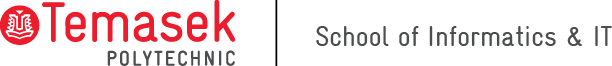
### <center>  Data Science Essentials (CIA2C14)</center>
### <center>  Individual Project</center>

### <font color=red>Fill in your personal data below

#### <font color=blue>Name: <font color=black> Koh Jun Yang Joshua
#### <font color=blue>Admin No: <font color=black> 2105077H
#### <font color=blue>Class: <font color=black> P02

### <font color=red> Declaration of Originality

#### I declare that I am the originator of this work and that all other original sources used in this work have been appropriately acknowledged.

#### I understand that plagiarism is the act of taking and using the whole or any part of another person’s work and presenting it as my own without proper acknowledgement.

#### I understand that allowing someone else to copy my work and submit it as their own is also considered as plagiarism.

#### I also understand that plagiarism is an academic offence and that disciplinary action will be taken for plagiarism.”

#### Please sign your name or insert a picture of your signature in the markdown cell below. (double click on the cell)


<div>
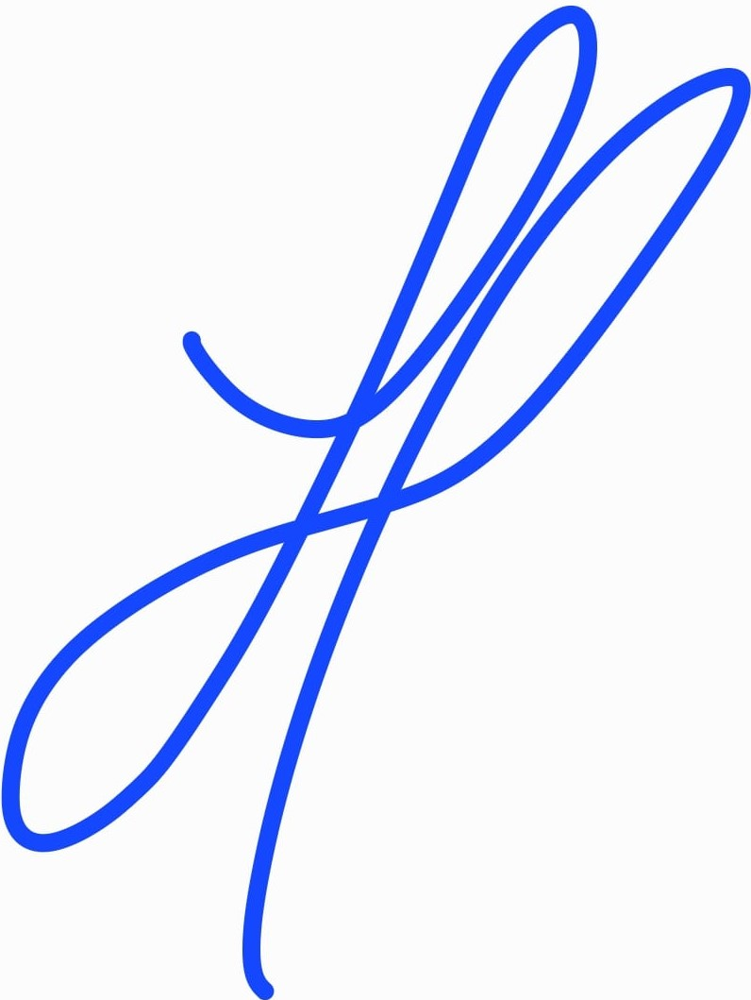
</div>

#### 1. This assignment deliverable is worth 45% of the final marks for DSES. The total mark is 90. There are two submissions required- Part I and Part II The due dates are  <font color=red>11 Jul and 07 Aug 2022, 11:59 pm. 
#### 2. For Part I submission, you need to complete Data Understanding and Data Preparation.
#### 3. For Part II submission, you need to complete Data Modelling, Recommendations & Conclusion.
#### 4. Note that you should still keep your codes for Part I for tutor to evaluate Part II. 
#### 5. This is an individual deliverable. You are required to produce your own work.
#### 6. You are allowed to use packages (libraries) not covered in the lecture slides or practicals (e.g. scikit-learn, seaborn, etc.)
#### 7. Apart from using Markdown cells to include your description, take-aways, and comments, provide sufficient comments to your codes too. 
#### 8. Name your notebook according to the following format. 
>e.g. YourName_2100001A_Assignment
#### 9. You need to submit your deliverable, i.e. this Jupyter Notebook (.ipynb format) for tutor marking.

# <font color= maroon> Project Background & Aims 

Airline X has collected information and feedback from its passengers with the aim of better understanding how passenger profiles and satisfaction with different services could affect their overall satisfaction level and from there, to identify their strengths and areas of focus to increase customer satisfaction levels.

# <font color= maroon>  Data Preparation 

Done procedurally:
- Data Checking
> To identify issue and problems within the data set
- Data Cleaning
> To remove unwanted data from a dataset 
- Data Transformation
> Changing the format, structure, or values of data

## <font color= grey> Data Checking

### Data Dictionary

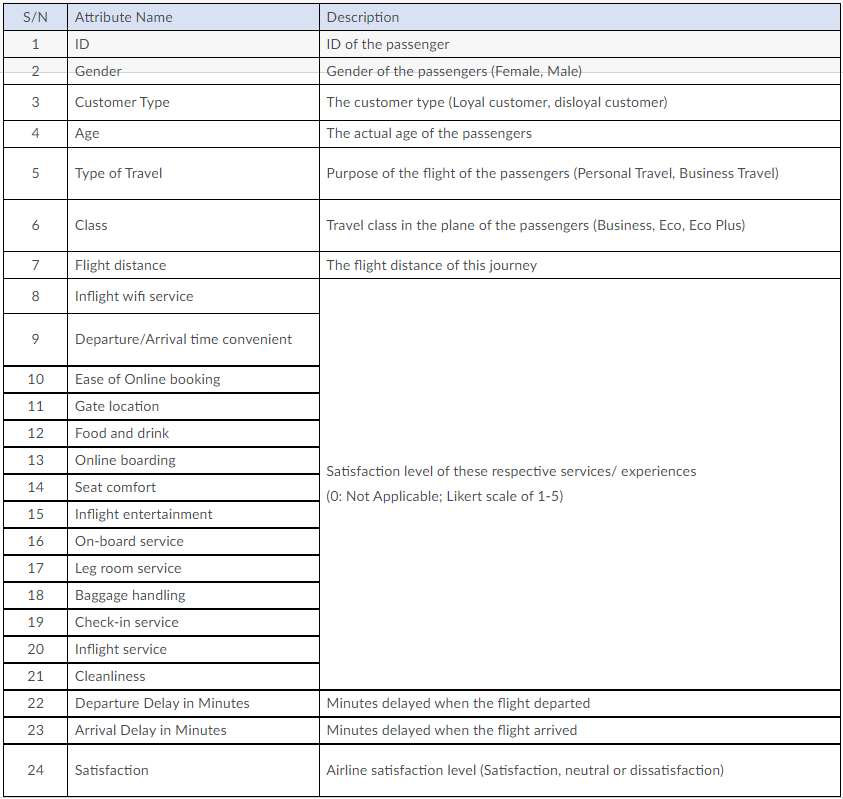

### Imports

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
sns.set()

from matplotlib import pyplot as plt
plt.rcParams.update(plt.rcParamsDefault)
plt.style.use('seaborn-colorblind')

%matplotlib inline
import matplotlib.ticker as mtick
from matplotlib.ticker import PercentFormatter

import plotly.graph_objects as go
import plotly.express as px

import missingno as msno

### Loading the data into a dataframe

In [2]:
# Loading the dataset as a dataframe
airline_data = pd.read_csv("./CSV/2_AssignmentDataSet.csv", delimiter=",")
airline_data.head()

D:\Applications\Anaconda\lib\site-packages\IPython\core\interactiveshell.py:3444: DtypeWarning: Columns (17) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,...,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
0,70172,Male,Loyal Customer,13.0,Personal Travel,Eco Plus,460,3,4.0,3.0,...,5,4,3,4,4,5,5,25.0,18.0,neutral or dissatisfied
1,5047,Male,disloyal Customer,25.0,Business travel,Business,235,3,2.0,3.0,...,1,1,5,3,1,4,1,1.0,6.0,neutral or dissatisfied
2,110028,Female,Loyal Customer,26.0,Business travel,Business,1142,2,2.0,2.0,...,5,4,3,4,4,4,5,0.0,0.0,satisfied
3,24026,Female,Loyal Customer,25.0,Business travel,Business,562,2,5.0,5.0,...,2,2,5,3,1,4,2,11.0,9.0,neutral or dissatisfied
4,119299,Male,Loyal Customer,61.0,Business travel,Business,214,3,3.0,3.0,...,3,3,4,4,3,3,3,0.0,0.0,satisfied


### Checking column count, entry count and datatype

In [3]:
airline_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103905 entries, 0 to 103904
Data columns (total 24 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   id                                 103905 non-null  int64  
 1   Gender                             103905 non-null  object 
 2   Customer Type                      103905 non-null  object 
 3   Age                                103900 non-null  float64
 4   Type of Travel                     103905 non-null  object 
 5   Class                              103905 non-null  object 
 6   Flight Distance                    103905 non-null  int64  
 7   Inflight wifi service              103905 non-null  int64  
 8   Departure/Arrival time convenient  103903 non-null  float64
 9   Ease of Online booking             103903 non-null  float64
 10  Gate location                      101714 non-null  float64
 11  Food and drink                     1039

We see from the above that:
1. There a few columns with possible missing values (<103905)
- <FONT COLOR="DarkRed"> Age
- <FONT COLOR="DarkRed"> Departure/Arrival time convenient
- <FONT COLOR="DarkRed"> Ease of Online booking
- <FONT COLOR="DarkRed"> Gate location
- <FONT COLOR="DarkRed"> Arrival Delay in Minutes
- <FONT COLOR="DarkRed"> satisfaction


2. There a column with an incorrect datatype
- <FONT COLOR="DarkRed"> Baggage handling


3. Column names don't match data dictionary
- <FONT COLOR="DarkRed"> id, satisfaction and Checkin service do not match the names listed in the data dictionary (ID, Satisfaction and Check-In service)

4. Some numerical columns are unnecessarily float64, these columns all use whole numbers (Etc Only 0-5) so no level of precision is required:
- <FONT COLOR="DarkRed"> Age
- <FONT COLOR="DarkRed"> Departure/Arrival time convenient
- <FONT COLOR="DarkRed"> Ease of Online booking
- <FONT COLOR="DarkRed"> Gate location
- <FONT COLOR="DarkRed"> Departure Delay in Minutes
- <FONT COLOR="DarkRed"> Arrival Delay in Minutes

### Summary statistics (numerical)

In [4]:
airline_data.describe()

,id,Age,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes
count,103905.000000,103900.000000,103905.000000,103905.000000,103903.000000,103903.000000,101714.000000,103905.000000,103905.000000,103905.000000,103905.000000,103905.000000,103905.000000,103905.000000,103905.000000,103905.000000,103905.000000,1.035950e+05
mean,64924.537751,39.387575,1189.444002,2.729686,3.060306,2.776185,2.976227,3.202156,3.250373,3.439392,3.358164,3.382369,3.351061,3.304288,3.640422,3.286338,14.886348,1.310142e+02
std,37463.982357,15.406294,997.159739,1.327961,1.525148,4.589239,1.277147,1.329540,1.349496,1.319075,1.332971,1.288342,1.315585,1.265390,1.175659,1.312251,44.569922,3.728306e+04
min,1.000000,-9.000000,31.000000,-1.000000,-1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00
25%,32534.000000,27.000000,414.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,3.000000,3.000000,2.000000,0.000000,0.000000e+00
50%,64857.000000,40.000000,843.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,4.000000,4.000000,4.000000,4.000000,3.000000,4.000000,3.000000,0.000000,0.000000e+00
75%,97369.000000,51.000000,1743.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,5.000000,4.000000,4.000000,4.000000,4.000000,5.000000,4.000000,12.000000,1.300000e+01
max,129880.000000,999.000000,4983.000000,5.000000,5.000000,999.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,7400.000000,1.200000e+07


We see from the above that:
1. Incorrect values are present
- <FONT COLOR="DarkRed"> Age (min -9, max 999. Not possible)
- <FONT COLOR="DarkRed"> Inflight wifi service (min -1. Not possible as per the Likert scale's 0-5)
- <FONT COLOR="DarkRed"> Departure/Arrival time convenient (min -1. Not possible as per the Likert scale's 0-5)
- <FONT COLOR="DarkRed"> Ease of Online booking (max 999. Not possible as per the Likert scale's 0-5)

2. Arrival Delay in Minutes has unusual values
- <FONT COLOR="DarkRed"> Contains exponents
- <FONT COLOR="DarkRed"> Count is very off (1.035950e+05 v 103905)

3. Departure Delay in Minutes has an unusually high max value 
- <FONT COLOR="DarkRed"> 5 days </FONT>. Not likely as the longest flight delay found via google was 2 days

### Summary statistics (categorical)

In [5]:
airline_data[['Gender', 'Customer Type', 'Type of Travel', 'Class', \
              'Baggage handling', 'satisfaction']].describe()

,Gender,Customer Type,Type of Travel,Class,Baggage handling,satisfaction
count,103905,103905,103905,103905,103905,103900
unique,2,6,2,3,11,2
top,Female,Loyal Customer,Business travel,Business,4,neutral or dissatisfied
freq,52727,84921,71657,49666,25542,58874


We see from the above that:
1. Some columns have incorrect unique values
- <FONT COLOR="DarkRed"> Customer Type (Supposed to only have 2, has 6)
- <FONT COLOR="DarkRed"> Baggage handling (Supposed to have 6, has 11)

2. satisfaction's top value doesn't match the data dictionary
- <FONT COLOR="DarkRed"> neutral or dissatisfied </FONT> v <FONT COLOR="DarkGreen"> neutral or dissatisfaction

3. Type of Travel's top value doesn't match the data dictionary
- <FONT COLOR="DarkRed"> Business travel </FONT> v <FONT COLOR="DarkGreen"> Business Travel

### Checking for missing data

In [6]:
airline_data.isna().sum()

id                                      0
Gender                                  0
Customer Type                           0
Age                                     5
Type of Travel                          0
Class                                   0
Flight Distance                         0
Inflight wifi service                   0
Departure/Arrival time convenient       2
Ease of Online booking                  2
Gate location                        2191
Food and drink                          0
Online boarding                         0
Seat comfort                            0
Inflight entertainment                  0
On-board service                        0
Leg room service                        0
Baggage handling                        0
Checkin service                         0
Inflight service                        0
Cleanliness                             0
Departure Delay in Minutes              0
Arrival Delay in Minutes              310
satisfaction                      

We confirm our earlier observation from the above that the columns with missing values are:
- <FONT COLOR="DarkRed"> Age (5)
- <FONT COLOR="DarkRed"> Departure/Arrival time convenient (2)
- <FONT COLOR="DarkRed"> Ease of Online booking (2)
- <FONT COLOR="DarkRed"> Gate location (2191)
- <FONT COLOR="DarkRed"> Arrival Delay in Minutes (310)
- <FONT COLOR="DarkRed"> satisfaction (5)

### Missingness of the data

<AxesSubplot:>

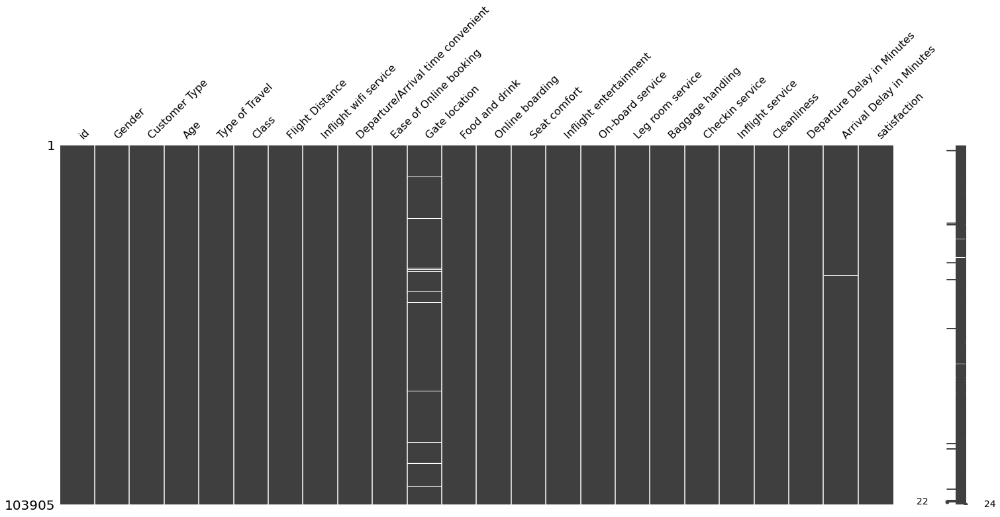

In [7]:
msno.matrix(airline_data.sort_values('Age'))

After looking at the nullity matrix sorted by Age, there is only 1 column with significant numbers of null values which is Gate location. 
- 'Arrival Delay in Minutes' also contains missing data in the nullity matrix

The values look random, this indicates that these values are likely missing completely at random (MCAR).

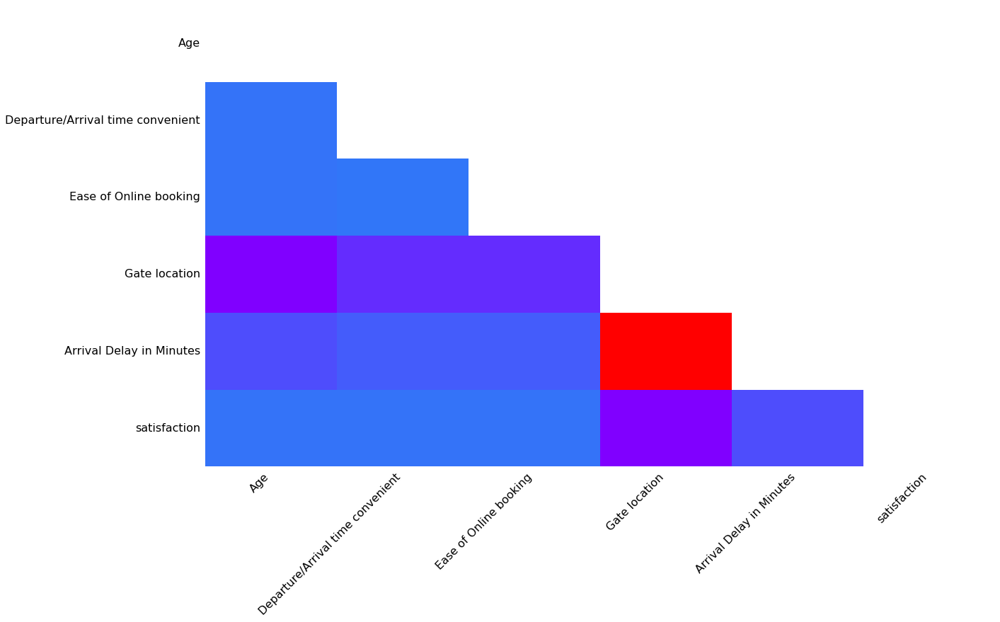

In [8]:
msno.heatmap(airline_data, cmap='rainbow');

The heatmap shows no score which again suggests complete randomness
- Cells without numbers in them score close to 0, e.g. have confidently completely random nullity correlations. It would be tedious to interpret a plot with a lot of 0 scores so the visualization leaves them out.

### Checking for duplicated data in id
id is the only column where unique values matter

In [9]:
airline_data[airline_data.duplicated(['id'], keep=False)]

# According to documentation:
# keep : {‘first’, ‘last’, False}, default ‘first’
# first : Mark duplicates as True except for the first occurrence.
# last : Mark duplicates as True except for the last occurrence.
# False : Mark all duplicates as True.

,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,...,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
19827,49443,Female,Loyal Customer,36.0,Business travel,Eco,156,4,2.0,2.0,...,4,3,4,5,3,2,4,0.0,0.0,satisfied
19828,49443,Female,Loyal Customer,36.0,Business travel,Eco,156,4,2.0,2.0,...,4,3,4,5,3,2,4,0.0,0.0,satisfied
42176,72507,Male,Loyal Customer,27.0,Business travel,Business,3247,5,5.0,5.0,...,4,5,2,5,5,5,4,0.0,0.0,satisfied
42177,72507,Male,Loyal Customer,27.0,Business travel,Business,3247,5,5.0,5.0,...,4,5,2,5,5,5,4,0.0,0.0,satisfied
103886,122528,Male,Loyal Customer,40.0,Business travel,Business,500,4,4.0,4.0,...,3,3,3,3,5,3,4,47.0,26.0,satisfied
103887,122528,Male,Loyal Customer,40.0,Business travel,Business,500,4,4.0,4.0,...,3,3,3,3,5,3,4,47.0,26.0,satisfied


We see from the above that:
- <FONT COLOR="DarkRed"> id 49443, 72507 and 122528 has 2 duplicated values respectively
- <FONT COLOR="DarkRed"> The duplicated columns share the same data

### Checking for if the column entries match the data dictionary
Only for Gender, Customer Type, Type of Travel, Class and Satisfaction

In [10]:
print(airline_data['Gender'].unique(),"\n")
print(airline_data['Customer Type'].unique(),"\n")
print(airline_data['Type of Travel'].unique(),"\n")
print(airline_data['Class'].unique(),"\n")
print(airline_data['satisfaction'].unique())

['Male' 'Female'] 

['Loyal Customer' 'disloyal Customer' 'loyal' 'Disloyal'
 'DISLOYAL CUSTOMER' 'Disloyal Customer'] 

['Personal Travel' 'Business travel'] 

['Eco Plus' 'Business' 'Eco'] 

['neutral or dissatisfied' 'satisfied' nan]


Wrong values in:
1. <FONT COLOR="DarkRed"> Customer Type
- <FONT COLOR="DarkRed"> The column is only supposed to have Loyal Customer and Disloyal Customer

2. <FONT COLOR="DarkRed"> satisfaction
- <FONT COLOR="DarkRed"> The column is only supposed to have neutral or dissatisfaction and Satisfaction

3. <FONT COLOR="DarkRed"> Type of Travel
- <FONT COLOR="DarkRed"> The value 'Business travel' does not match the data dictionary ('Business Travel')

### Checking for outliers and anomalous values
Only for Age, Flight Distance, Arrival Delay in Minutes, Departure Delay in Minutes

In [11]:
# I created a sub df to facilitate the creation of boxplot to visualize outliers and anomalous values
airline_data_outvis = airline_data[['Age', 'Flight Distance','Departure Delay in Minutes']]
print(airline_data_outvis.head(),'\n')

# Arrival Delay in Minutes has to be handled seperately as it is anticipated
# That values may be conatiend within that are too large to usefully plot beside airline_data_outvis

    Age  Flight Distance  Departure Delay in Minutes
0  13.0              460                        25.0
1  25.0              235                         1.0
2  26.0             1142                         0.0
3  25.0              562                        11.0
4  61.0              214                         0.0 



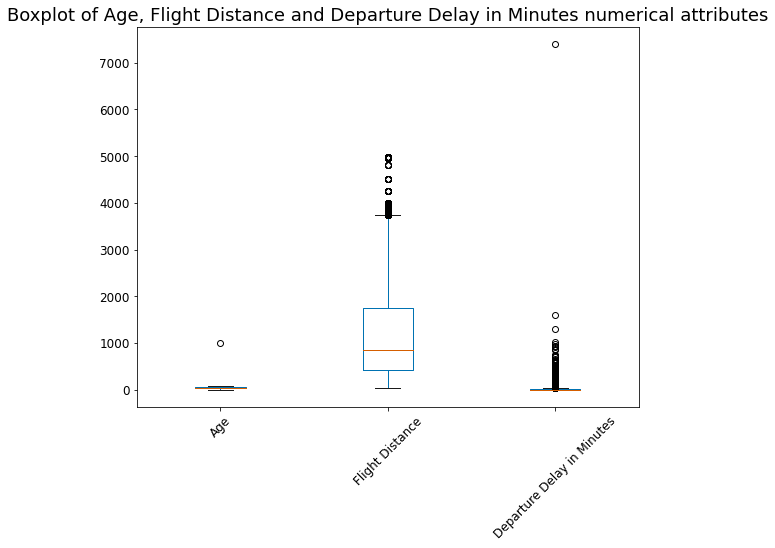

In [12]:
plt.figure(figsize=(9,7)) #Define a space to plot
airline_data_outvis.boxplot(grid=False, rot=45, fontsize=12)

plt.title("Boxplot of Age, Flight Distance and Departure Delay in Minutes numerical attributes", fontsize=18)
plt.show()

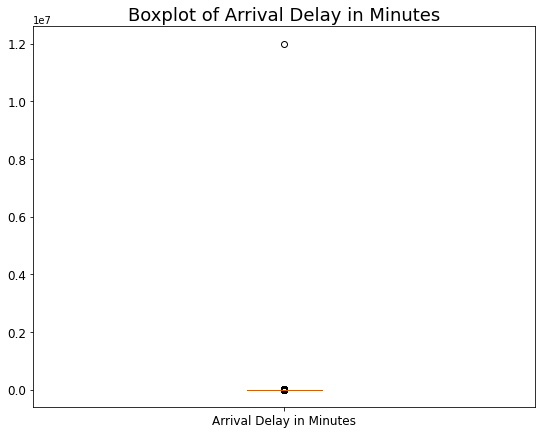

In [13]:
plt.figure(figsize=(9,7)) #Define a space to plot
airline_data.boxplot(column='Arrival Delay in Minutes', grid=False, fontsize=12, figsize=(6,3)) # Rotate the labels
# Grid - shows grid in bplot
# Rot - rotate var name 45 degrees
plt.title("Boxplot of Arrival Delay in Minutes", fontsize=18)
plt.show()

We see from above that many outliers are seen, most are explainable as Departure Delay in Minutes and Arrival Delay in Minutes have a majority of their values at 0 (Lower and Middle percentile) 

More importantly however, <FONT COLOR="DarkRed"> anomalous values are found in Age, Departure Delay in Minutes and Arrival Delay in Minutes</FONT>, I confirm my findings from the Summary statistics above

### Checking On-board service and Inflight service for duplication
The name of the two services can be reasoned to be referring to the same service, however that is not true

In [14]:
airline_data['On-board service'].equals(airline_data['Inflight service']) 

False

***

## <font color= grey> Data Cleaning

### To make it easier to use the column names later on, i'll be replacing the spaces with underscores

<FONT COLOR="DarkRed"> Column names (and table names) should not have spaces or any other invalid characters in them.
- This is considered bad practice because it requires you to use square brackets around the names

In [15]:
airline_data.columns = [c.replace(' ', '_') for c in airline_data.columns]
airline_data.head()

,id,Gender,Customer_Type,Age,Type_of_Travel,Class,Flight_Distance,Inflight_wifi_service,Departure/Arrival_time_convenient,Ease_of_Online_booking,...,Inflight_entertainment,On-board_service,Leg_room_service,Baggage_handling,Checkin_service,Inflight_service,Cleanliness,Departure_Delay_in_Minutes,Arrival_Delay_in_Minutes,satisfaction
0,70172,Male,Loyal Customer,13.0,Personal Travel,Eco Plus,460,3,4.0,3.0,...,5,4,3,4,4,5,5,25.0,18.0,neutral or dissatisfied
1,5047,Male,disloyal Customer,25.0,Business travel,Business,235,3,2.0,3.0,...,1,1,5,3,1,4,1,1.0,6.0,neutral or dissatisfied
2,110028,Female,Loyal Customer,26.0,Business travel,Business,1142,2,2.0,2.0,...,5,4,3,4,4,4,5,0.0,0.0,satisfied
3,24026,Female,Loyal Customer,25.0,Business travel,Business,562,2,5.0,5.0,...,2,2,5,3,1,4,2,11.0,9.0,neutral or dissatisfied
4,119299,Male,Loyal Customer,61.0,Business travel,Business,214,3,3.0,3.0,...,3,3,4,4,3,3,3,0.0,0.0,satisfied


### Resolving missing values
- <FONT COLOR="DarkRed"> Age (5) (int64)
- <FONT COLOR="DarkRed"> Departure/Arrival time convenient (2) (float64)
- <FONT COLOR="DarkRed"> Ease of Online booking (2) (float64)
- <FONT COLOR="DarkRed"> Gate location (2191) (float64)
- <FONT COLOR="DarkRed"> Arrival Delay in Minutes (310) (float64)
- <FONT COLOR="DarkRed"> satisfaction (5) (object)

In [16]:
age_grouped = airline_data.groupby(['Gender', 'Class'])
age_grouped.Age.median()

Gender  Class   
Female  Business    42.0
        Eco         36.0
        Eco Plus    37.0
Male    Business    42.0
        Eco         37.0
        Eco Plus    38.0
Name: Age, dtype: float64

In [17]:
ArrivDel_grouped = airline_data.groupby(['Flight_Distance'])
ArrivDel_grouped.Arrival_Delay_in_Minutes.median()

Flight_Distance
31       0.0
56       1.0
67       4.0
73       5.0
74       0.0
        ... 
4243    14.5
4502     1.0
4817    14.0
4963     2.0
4983     0.0
Name: Arrival_Delay_in_Minutes, Length: 3802, dtype: float64

In [18]:
# We fill Age and Arrival Delay in Minutes with its median as the mean is currently influenced by the 
# anomalous values, hence:


# Age
# Grouped dataframe from 'Gender' and 'Class' as Gender and Ticket class are factors that I believe are likely to affect Age
age_grouped = airline_data.groupby(['Gender', 'Class'])
airline_data['Age'] = age_grouped.Age.apply(lambda age:age.fillna(age.median()))


# Arrival_Delay_in_Minutes
# Grouped dataframe from 'Flight_Distance' as Flight Distance is a factor that I believe is likely to affect the Arrival Delay
ArrivDel_grouped = airline_data.groupby(['Flight_Distance'])
airline_data['Arrival_Delay_in_Minutes'] = ArrivDel_grouped.Arrival_Delay_in_Minutes.apply(lambda adm:adm.fillna(adm.median()))


# We fill Departure/Arrival time convenient, Ease of Online booking and Gate location with its mode, hence:
airline_data['Departure/Arrival_time_convenient'].fillna(airline_data['Departure/Arrival_time_convenient'].mode()[0], inplace=True)
airline_data['Ease_of_Online_booking'].fillna(airline_data['Ease_of_Online_booking'].mode()[0], inplace=True)
airline_data['Gate_location'].fillna(airline_data['Gate_location'].mode()[0], inplace=True)


# I'll drop all rows with missing data in satisfaction to avoid introducing bias into the data
airline_data.dropna(subset=['satisfaction'], inplace=True)


# To check if the process has been successful
airline_data.isna().sum()

id                                   0
Gender                               0
Customer_Type                        0
Age                                  0
Type_of_Travel                       0
Class                                0
Flight_Distance                      0
Inflight_wifi_service                0
Departure/Arrival_time_convenient    0
Ease_of_Online_booking               0
Gate_location                        0
Food_and_drink                       0
Online_boarding                      0
Seat_comfort                         0
Inflight_entertainment               0
On-board_service                     0
Leg_room_service                     0
Baggage_handling                     0
Checkin_service                      0
Inflight_service                     0
Cleanliness                          0
Departure_Delay_in_Minutes           0
Arrival_Delay_in_Minutes             0
satisfaction                         0
dtype: int64

### Resolving erronous values
- <FONT COLOR="DarkRed"> Age (min -9, max 999. Not possible and has no explaination within reason)
- <FONT COLOR="DarkRed"> Inflight wifi service (min -1. Not possible as per the Likert scale's 0-5 and has no explaination within reason)
- <FONT COLOR="DarkRed"> Departure/Arrival time convenient (min -1. Not possible as per the Likert scale's 0-5 and has no explaination within reason)
- <FONT COLOR="DarkRed"> Ease of Online booking (max 999. Not possible as per the Likert scale's 0-5 and has no explaination within reason)

In [19]:
# Age
# To resolve this I'll be removing the anomalous values, hence:

airline_data.drop(airline_data[(airline_data['Age'] < 7) | (airline_data['Age'] > 85)].index, inplace=True)

# Checking min max values and head for irregularities
print("Min = ", airline_data['Age'].min(), "\n")
print("Max = ", airline_data['Age'].max(), "\n")
airline_data['Age'].head()

# The anomalous values have been removed

Min =  7.0 

Max =  85.0 



0    13.0
1    25.0
2    26.0
3    25.0
4    61.0
Name: Age, dtype: float64

In [20]:
# Inflight wifi service, Departure/Arrival time convenient and Ease of Online booking have anomalous values
# To resolve this I'll be dropping rows with the values, hence:

# Created to shrink down code length
IWS = 'Inflight_wifi_service'
DATC = 'Departure/Arrival_time_convenient'
EOOB = 'Ease_of_Online_booking'

airline_data.drop(airline_data[(airline_data[IWS] < 0) | (airline_data[IWS] > 5)].index, inplace=True)
airline_data.drop(airline_data[(airline_data[DATC] < 0) | (airline_data[DATC] > 5)].index, inplace=True)
airline_data.drop(airline_data[(airline_data[EOOB] < 0) | (airline_data[EOOB] > 5)].index, inplace=True)

# Checking min max values and head for irregularities
print('Inflight_wifi_service', "\n")
print("Min = ", airline_data[IWS].min(), "\n")
print("Max = ", airline_data[IWS].max(), "\n")
print(airline_data[IWS].head(), "\n")

print('Departure/Arrival_time_convenient', "\n")
print("Min = ", airline_data[DATC].min(), "\n")
print("Max = ", airline_data[DATC].max(), "\n")
print(airline_data[DATC].head(), "\n")

print('Ease_of_Online_booking', "\n")
print("Min = ", airline_data[EOOB].min(), "\n")
print("Max = ", airline_data[EOOB].max(), "\n")
print(airline_data[EOOB].head(), "\n")

# The anomalous values have been removed

Inflight_wifi_service 

Min =  0 

Max =  5 

0    3
1    3
2    2
3    2
4    3
Name: Inflight_wifi_service, dtype: int64 

Departure/Arrival_time_convenient 

Min =  0.0 

Max =  5.0 

0    4.0
1    2.0
2    2.0
3    5.0
4    3.0
Name: Departure/Arrival_time_convenient, dtype: float64 

Ease_of_Online_booking 

Min =  0.0 

Max =  5.0 

0    3.0
1    3.0
2    2.0
3    5.0
4    3.0
Name: Ease_of_Online_booking, dtype: float64 



### Resolving Baggage handling's data type and unique value issues
- <FONT COLOR="DarkRed"> Supposed to have 6, has 11 instead
- It's a object now but should change to interger datatype once the string values have been handled

In [21]:
# Finding all unique values in Baggage handling
airline_data['Baggage_handling'].unique()

array(['4', '3', '5', '1', '2', '-', 5, 3, 4, 2, 1], dtype=object)

<FONT COLOR="DarkRed"> We can see that Baggage handling has string values within, however as some string values ('4', '3', '5', '1', '2') match with the integer values (5, 3, 4, 2, 1).

<FONT COLOR="DarkGreen"> As such it can be reasoned that the issue with these string values in particular may simply stem from improper data collection (perhaps with the way the survey form retrieves the data) and that the values are accurate, as such i'll be retaining them.

<FONT COLOR="DarkRed"> '-' on the other hand cannot be adequately explained by erronous data collection, hence I replaced it with the mode of Baggage handling

In [22]:
airline_data['Baggage_handling'] = airline_data['Baggage_handling'].replace('4', 4).\
replace('3', 3).replace('5', 5).replace('1', 1).replace('2', 2).\
replace('-', airline_data['Baggage_handling'].mode()[0])

In [23]:
# Checking if changes have been implemented
print(airline_data['Baggage_handling'].unique())
print(airline_data['Baggage_handling'].isna().sum())

[4 3 5 1 2]
0


### Resolving Customer Type's unique value issues
- <FONT COLOR="DarkRed"> Supposed to only have 2, has 6 instead

In [24]:
# Finding all unique values in Customer Type
airline_data['Customer_Type'].unique()

array(['Loyal Customer', 'disloyal Customer', 'loyal', 'Disloyal',
       'DISLOYAL CUSTOMER', 'Disloyal Customer'], dtype=object)

<FONT COLOR="DarkGreen"> We can see that Customer Type has varying values within, those values are likely matches for the actual values (Loyal Customer, Disloyal Customer) as they share the same categorization (Loyal, Disloyal), hence i'll be replacing them as such

In [25]:
LC = 'Loyal customer'
DC = 'disloyal customer'

airline_data['Customer_Type'] = airline_data['Customer_Type'].replace('disloyal Customer', DC).\
replace('loyal', LC).replace('Disloyal', DC).replace('DISLOYAL CUSTOMER', DC).replace('Loyal Customer', LC).\
replace('Disloyal Customer', DC)

In [26]:
# Checking if changes have been implemented
print(airline_data['Customer_Type'].unique())
print(airline_data['Customer_Type'].isna().sum())

['Loyal customer' 'disloyal customer']
0


### Figuring out the cause of the unusual values in Arrival Delay in Minutes
- <FONT COLOR="DarkRed"> Contains exponents
- <FONT COLOR="DarkRed"> Count is very off (1.035950e+05 v 103905)

In [27]:
# Count appears to be correct
airline_data['Arrival_Delay_in_Minutes'].count()

103890

In [28]:
# No missing data either
airline_data['Arrival_Delay_in_Minutes'].isna().sum()

0

In [29]:
# Values appear to be presented correctly
airline_data['Arrival_Delay_in_Minutes']

0         18.0
1          6.0
2          0.0
3          9.0
4          0.0
          ... 
103899     0.0
103900     0.0
103901     0.0
103903     0.0
103904     0.0
Name: Arrival_Delay_in_Minutes, Length: 103890, dtype: float64

In [30]:
# To sort the values in Arrival Delay in Minutes and Departure Delay in Minutes by descending to confirm if these are outliers or anomalous values
# In this case they do lie an abnormal distance from other values (12000000 v 1584), (7400 v 1592) respectively
print('Arrival_Delay_in_Minutes')
print(airline_data['Arrival_Delay_in_Minutes'].sort_values(ascending=False), '\n')
print('Departure_Delay_in_Minutes')
print(airline_data['Departure_Delay_in_Minutes'].sort_values(ascending=False))

Arrival_Delay_in_Minutes
94452     12000000.0
83742         1584.0
6744          1280.0
61311         1011.0
72207          970.0
             ...    
44423            0.0
44421            0.0
44420            0.0
44419            0.0
103904           0.0
Name: Arrival_Delay_in_Minutes, Length: 103890, dtype: float64 

Departure_Delay_in_Minutes
91364     7400.0
83742     1592.0
6744      1305.0
61311     1017.0
72207      978.0
           ...  
44435        0.0
44433        0.0
44432        0.0
44430        0.0
103904       0.0
Name: Departure_Delay_in_Minutes, Length: 103890, dtype: float64


<FONT COLOR="DarkGreen"> This is probably just an issue with the float64 datatype and the describe() display constraints

In this process, I have also discovered that <FONT COLOR="DarkRed"> the max is 12000000 minutes = 200000 hours = 8333 Days = 22 years
- Very unlikely and is a anomalous value, must be handled

### Removing anomalous values in max of Arrival Delay in Minutes and outliers in Departure Delay in Minutes
- <FONT COLOR="DarkRed"> Arrival Delay in Minutes max = 7400
- <FONT COLOR="DarkRed"> Departure Delay in Minutes max = 12000000 

In [31]:
# The anomalous values will be removed
airline_data.drop(airline_data[(airline_data['Arrival_Delay_in_Minutes'] >= 12000000)].index, inplace=True)

# The outlier will also be removed
airline_data.drop(airline_data[(airline_data['Departure_Delay_in_Minutes'] >= 7400)].index, inplace=True)


print('Arrival_Delay_in_Minutes')
print(airline_data['Arrival_Delay_in_Minutes'].sort_values(ascending=False), '\n')
print('Departure_Delay_in_Minutes')
print(airline_data['Departure_Delay_in_Minutes'].sort_values(ascending=False))

Arrival_Delay_in_Minutes
83742     1584.0
6744      1280.0
61311     1011.0
72207      970.0
61288      952.0
           ...  
53854        0.0
13154        0.0
53856        0.0
53857        0.0
103904       0.0
Name: Arrival_Delay_in_Minutes, Length: 103888, dtype: float64 

Departure_Delay_in_Minutes
83742     1592.0
6744      1305.0
61311     1017.0
72207      978.0
80183      933.0
           ...  
51826        0.0
51828        0.0
10270        0.0
51831        0.0
103904       0.0
Name: Departure_Delay_in_Minutes, Length: 103888, dtype: float64


### Resolving duplicated data in id
- <FONT COLOR="DarkRed"> id's 49443, 72507 and 122528 has 1 duplicated value respectively

In [32]:
# As discovered, duplicates exist with the above id's. They possess the same information as their respective duplicates,
# As such I will simply remove the duplicates of the respective id's, hence:

airline_data.drop_duplicates(subset=["id"], keep='first', inplace=True, ignore_index=False)

In [33]:
# Checking for successful removal
airline_data[airline_data.duplicated(['id'], keep=False)]

,id,Gender,Customer_Type,Age,Type_of_Travel,Class,Flight_Distance,Inflight_wifi_service,Departure/Arrival_time_convenient,Ease_of_Online_booking,...,Inflight_entertainment,On-board_service,Leg_room_service,Baggage_handling,Checkin_service,Inflight_service,Cleanliness,Departure_Delay_in_Minutes,Arrival_Delay_in_Minutes,satisfaction


### satisfaction's values don't match the data dictionary
- <FONT COLOR="DarkRed"> neutral or dissatisfied </FONT> v <FONT COLOR="DarkGreen"> neutral or dissatisfaction

In [34]:
airline_data['satisfaction'].unique()

array(['neutral or dissatisfied', 'satisfied'], dtype=object)

The values are extremely similar to the ones listed in the data dictionary:
 - neutral or dissatisfied v neutral or dissatisfaction
 - satisfied v Satisfaction
 
As those values are likely matches for the actual values, i'll be replacing them as such

In [35]:
airline_data['satisfaction'] = airline_data['satisfaction'].replace('neutral or dissatisfied', 'neutral or dissatisfaction').\
replace('satisfied', 'Satisfaction')
# Checking if the process has gone smoothly
airline_data['satisfaction'].unique()

array(['neutral or dissatisfaction', 'Satisfaction'], dtype=object)

### One of Type_of_Travel's values doesn't match the data dictionary
- <FONT COLOR="DarkRed"> Business travel </FONT> v <FONT COLOR="DarkGreen"> Business Travel

In [36]:
airline_data['Type_of_Travel'] = airline_data['Type_of_Travel'].replace('Business travel', 'Business Travel')
# Checking if the process has gone smoothly
airline_data['Type_of_Travel'].unique()

array(['Personal Travel', 'Business Travel'], dtype=object)

### To re-index the dataframe

In [37]:
airline_data = airline_data.reset_index(drop=True)

In [38]:
airline_data

,id,Gender,Customer_Type,Age,Type_of_Travel,Class,Flight_Distance,Inflight_wifi_service,Departure/Arrival_time_convenient,Ease_of_Online_booking,...,Inflight_entertainment,On-board_service,Leg_room_service,Baggage_handling,Checkin_service,Inflight_service,Cleanliness,Departure_Delay_in_Minutes,Arrival_Delay_in_Minutes,satisfaction
0,70172,Male,Loyal customer,13.0,Personal Travel,Eco Plus,460,3,4.0,3.0,...,5,4,3,4,4,5,5,25.0,18.0,neutral or dissatisfaction
1,5047,Male,disloyal customer,25.0,Business Travel,Business,235,3,2.0,3.0,...,1,1,5,3,1,4,1,1.0,6.0,neutral or dissatisfaction
2,110028,Female,Loyal customer,26.0,Business Travel,Business,1142,2,2.0,2.0,...,5,4,3,4,4,4,5,0.0,0.0,Satisfaction
3,24026,Female,Loyal customer,25.0,Business Travel,Business,562,2,5.0,5.0,...,2,2,5,3,1,4,2,11.0,9.0,neutral or dissatisfaction
4,119299,Male,Loyal customer,61.0,Business Travel,Business,214,3,3.0,3.0,...,3,3,4,4,3,3,3,0.0,0.0,Satisfaction
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103880,60666,Male,Loyal customer,50.0,Personal Travel,Eco,1620,3,1.0,3.0,...,2,4,3,4,2,4,2,0.0,0.0,neutral or dissatisfaction
103881,94171,Female,disloyal customer,23.0,Business Travel,Eco,192,2,1.0,2.0,...,2,3,1,4,2,3,2,3.0,0.0,neutral or dissatisfaction
103882,73097,Male,Loyal customer,49.0,Business Travel,Business,2347,4,4.0,4.0,...,5,5,5,5,5,5,4,0.0,0.0,Satisfaction
103883,54173,Female,disloyal customer,22.0,Business Travel,Eco,1000,1,1.0,1.0,...,1,4,5,1,5,4,1,0.0,0.0,neutral or dissatisfaction


***

## <font color= grey> Data Transformation

## Transformation 1
### Binning <FONT COLOR="DarkGreen"> Flight_Distance </FONT> to facilitate later analysis 
- Short-haul : < 1,500KM
- Medium-haul : 1,500KM - 2,200KM
- Long-haul : > 2,200KM

https://en.wikipedia.org/wiki/Flight_length

In [39]:
# To preserve the column for numerical analysis later
airline_data['Flight_Distance_Num'] = airline_data['Flight_Distance']

def myfunc(x):
    if x>=1 and x<=1500:
        return 'Short-haul'
    elif x>=1501 and x<=2199:
        return 'Medium-haul'
    else:
        return 'Long-haul'
    
airline_data['Flight_Distance'] = airline_data['Flight_Distance'].replace().apply(myfunc)
airline_data['Flight_Distance'].unique()

array(['Short-haul', 'Medium-haul', 'Long-haul'], dtype=object)

## Transformation 2
### Creating new column, <FONT COLOR="DarkGreen"> Avg_services_rating </FONT> to facilitate later analysis of the overall average of all ratings by row
#### 0's should not be counted as the dictionary states that 0 just means NA


In [40]:
# create a subset for the rating columns
ratings = ['Inflight_wifi_service', 'Departure/Arrival_time_convenient', 'Ease_of_Online_booking', \
           'Gate_location', 'Food_and_drink', 'Online_boarding', 'Seat_comfort', 'Inflight_entertainment', \
           'On-board_service', 'Leg_room_service', 'Baggage_handling', 'Checkin_service', 'Inflight_service', \
           'Cleanliness']

ratings_pd = pd.DataFrame(airline_data[ratings])

# Replace 0 with NaN as Mean() by default ignores NaN values
ratings_pd = ratings_pd.replace(0, np.NaN)
airline_data['Avg_services_rating'] = ratings_pd.mean(axis=1).round(2)
airline_data['Avg_services_rating']

0         3.86
1         2.29
2         3.71
3         3.00
4         3.50
          ... 
103880    2.79
103881    2.21
103882    4.36
103883    2.29
103884    2.00
Name: Avg_services_rating, Length: 103885, dtype: float64

## Transformation 3
### Binning <FONT COLOR="DarkGreen"> Age </FONT> to facilitate later analysis 
- Children (01-14 years)
- Youth (15-24 years)
- Adults (25-64 years)
- Seniors (65 years and over)

https://www.statcan.gc.ca/en/concepts/definitions/age2

In [41]:
# To preserve the column for numerical analysis later
airline_data['Age_Num'] = airline_data['Age']

def myfunc(x):
    if x>=1 and x<=14:
        return 'Child'
    elif x>= 15 and x<=24:
        return 'Youth'
    elif x>=25 and x<=64:
        return 'Adult'
    else:
        return 'Senior'

airline_data['Age'] = airline_data['Age'].replace().apply(myfunc)
airline_data['Age'].unique()

array(['Child', 'Adult', 'Youth', 'Senior'], dtype=object)

## Transformation 4
### Removing ID column
<FONT COLOR="DarkRed"> This is done to reduce clutter</FONT>
- The id column has already served its purpose to locate duplications and will provide no new useful insights as there does not appear to be any pattern to the column, likely as it has gone through data masking

In [42]:
del airline_data["id"]
airline_data.head()

,Gender,Customer_Type,Age,Type_of_Travel,Class,Flight_Distance,Inflight_wifi_service,Departure/Arrival_time_convenient,Ease_of_Online_booking,Gate_location,...,Baggage_handling,Checkin_service,Inflight_service,Cleanliness,Departure_Delay_in_Minutes,Arrival_Delay_in_Minutes,satisfaction,Flight_Distance_Num,Avg_services_rating,Age_Num
0,Male,Loyal customer,Child,Personal Travel,Eco Plus,Short-haul,3,4.0,3.0,1.0,...,4,4,5,5,25.0,18.0,neutral or dissatisfaction,460,3.86,13.0
1,Male,disloyal customer,Adult,Business Travel,Business,Short-haul,3,2.0,3.0,3.0,...,3,1,4,1,1.0,6.0,neutral or dissatisfaction,235,2.29,25.0
2,Female,Loyal customer,Adult,Business Travel,Business,Short-haul,2,2.0,2.0,2.0,...,4,4,4,5,0.0,0.0,Satisfaction,1142,3.71,26.0
3,Female,Loyal customer,Adult,Business Travel,Business,Short-haul,2,5.0,5.0,5.0,...,3,1,4,2,11.0,9.0,neutral or dissatisfaction,562,3.00,25.0
4,Male,Loyal customer,Adult,Business Travel,Business,Short-haul,3,3.0,3.0,3.0,...,4,3,3,3,0.0,0.0,Satisfaction,214,3.50,61.0


## Transformation 5
### Incorrect column names
- <FONT COLOR="DarkRed"> satisfaction and Checkin service do not match the names listed in the data dictionary (Satisfaction and Check-In service respectively)
- This is largely just a cosmetic change

In [43]:
airline_data = airline_data.rename(columns={"satisfaction": "Satisfaction",\
                                            "Checkin_service": "Check-in_Service"})

## Transformation 6
### Resolving incorrect data type
This is done to remove trailing decimals as precision isn't required due to the values being whole numbers
- Age_Num (Should be int64)
- Departure/Arrival time convenient (Should be int64)
- Ease of Online booking (Should be int64)
- Gate location (Should be int64)
- Departure Delay in Minutes (Should be int64)
- Arrival Delay in Minutes (Should be int64)

In [44]:
airline_data = airline_data.astype({'Age_Num':'int64',\
                                    'Departure/Arrival_time_convenient':'int64',\
                                    'Ease_of_Online_booking':'int64',\
                                    'Gate_location':'int64',\
                                    'Departure_Delay_in_Minutes':'int64',\
                                    'Arrival_Delay_in_Minutes':'int64'})
airline_data.dtypes

Gender                                object
Customer_Type                         object
Age                                   object
Type_of_Travel                        object
Class                                 object
Flight_Distance                       object
Inflight_wifi_service                  int64
Departure/Arrival_time_convenient      int64
Ease_of_Online_booking                 int64
Gate_location                          int64
Food_and_drink                         int64
Online_boarding                        int64
Seat_comfort                           int64
Inflight_entertainment                 int64
On-board_service                       int64
Leg_room_service                       int64
Baggage_handling                       int64
Check-in_Service                       int64
Inflight_service                       int64
Cleanliness                            int64
Departure_Delay_in_Minutes             int64
Arrival_Delay_in_Minutes               int64
Satisfacti

***

### Final Checks

In [45]:
airline_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103885 entries, 0 to 103884
Data columns (total 26 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   Gender                             103885 non-null  object 
 1   Customer_Type                      103885 non-null  object 
 2   Age                                103885 non-null  object 
 3   Type_of_Travel                     103885 non-null  object 
 4   Class                              103885 non-null  object 
 5   Flight_Distance                    103885 non-null  object 
 6   Inflight_wifi_service              103885 non-null  int64  
 7   Departure/Arrival_time_convenient  103885 non-null  int64  
 8   Ease_of_Online_booking             103885 non-null  int64  
 9   Gate_location                      103885 non-null  int64  
 10  Food_and_drink                     103885 non-null  int64  
 11  Online_boarding                    1038

<FONT COLOR="DarkGreen"> Column count, Data type and column names are correct

In [46]:
airline_data.describe()

,Inflight_wifi_service,Departure/Arrival_time_convenient,Ease_of_Online_booking,Gate_location,Food_and_drink,Online_boarding,Seat_comfort,Inflight_entertainment,On-board_service,Leg_room_service,Baggage_handling,Check-in_Service,Inflight_service,Cleanliness,Departure_Delay_in_Minutes,Arrival_Delay_in_Minutes,Flight_Distance_Num,Avg_services_rating,Age_Num
count,103885.000000,103885.000000,103885.000000,103885.000000,103885.000000,103885.000000,103885.000000,103885.000000,103885.000000,103885.000000,103885.000000,103885.000000,103885.000000,103885.000000,103885.000000,103885.000000,103885.000000,103885.000000,103885.000000
mean,2.729807,3.060480,2.757029,2.976821,3.202079,3.250315,3.439284,3.358127,3.382346,3.351148,3.631766,3.304202,3.640391,3.286317,14.815142,15.136853,1189.348395,3.276525,39.379622
std,1.327800,1.525025,1.398863,1.263578,1.329567,1.349502,1.319098,1.333000,1.288372,1.315603,1.180862,1.265384,1.175667,1.312263,38.232289,38.650830,997.096022,0.652533,15.115312
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,31.000000,1.140000,7.000000
25%,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,3.000000,3.000000,3.000000,2.000000,0.000000,0.000000,414.000000,2.790000,27.000000
50%,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,4.000000,4.000000,4.000000,4.000000,4.000000,3.000000,4.000000,3.000000,0.000000,0.000000,843.000000,3.290000,40.000000
75%,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,5.000000,4.000000,4.000000,4.000000,5.000000,4.000000,5.000000,4.000000,12.000000,13.000000,1742.000000,3.730000,51.000000
max,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,1592.000000,1584.000000,4983.000000,5.000000,85.000000


<FONT COLOR="DarkGreen"> Values match changes and are within expectations

In [47]:
airline_data[['Gender', 'Customer_Type', 'Type_of_Travel', 'Class', \
              'Satisfaction', 'Flight_Distance', 'Age']].describe()

,Gender,Customer_Type,Type_of_Travel,Class,Satisfaction,Flight_Distance,Age
count,103885,103885,103885,103885,103885,103885,103885
unique,2,2,2,3,2,3,4
top,Female,Loyal customer,Business Travel,Business,neutral or dissatisfaction,Short-haul,Adult
freq,52719,84907,71639,49652,58869,72425,79324


<FONT COLOR="DarkGreen"> Values match changes and are within expectations

In [48]:
airline_data.isna().sum()

Gender                               0
Customer_Type                        0
Age                                  0
Type_of_Travel                       0
Class                                0
Flight_Distance                      0
Inflight_wifi_service                0
Departure/Arrival_time_convenient    0
Ease_of_Online_booking               0
Gate_location                        0
Food_and_drink                       0
Online_boarding                      0
Seat_comfort                         0
Inflight_entertainment               0
On-board_service                     0
Leg_room_service                     0
Baggage_handling                     0
Check-in_Service                     0
Inflight_service                     0
Cleanliness                          0
Departure_Delay_in_Minutes           0
Arrival_Delay_in_Minutes             0
Satisfaction                         0
Flight_Distance_Num                  0
Avg_services_rating                  0
Age_Num                  

<FONT COLOR="DarkGreen"> No missing data

In [49]:
print(airline_data['Gender'].unique(),"\n")
print(airline_data['Age'].unique(),"\n")
print(airline_data['Customer_Type'].unique(),"\n")
print(airline_data['Type_of_Travel'].unique(),"\n")
print(airline_data['Class'].unique(),"\n")
print(airline_data['Satisfaction'].unique())

['Male' 'Female'] 

['Child' 'Adult' 'Youth' 'Senior'] 

['Loyal customer' 'disloyal customer'] 

['Personal Travel' 'Business Travel'] 

['Eco Plus' 'Business' 'Eco'] 

['neutral or dissatisfaction' 'Satisfaction']


<FONT COLOR="DarkRed"> Column values match the data dictionary

In [50]:
# Overview of finalized dataframe
pd.set_option('display.max_columns', None)
airline_data.head()

,Gender,Customer_Type,Age,Type_of_Travel,Class,Flight_Distance,Inflight_wifi_service,Departure/Arrival_time_convenient,Ease_of_Online_booking,Gate_location,Food_and_drink,Online_boarding,Seat_comfort,Inflight_entertainment,On-board_service,Leg_room_service,Baggage_handling,Check-in_Service,Inflight_service,Cleanliness,Departure_Delay_in_Minutes,Arrival_Delay_in_Minutes,Satisfaction,Flight_Distance_Num,Avg_services_rating,Age_Num
0,Male,Loyal customer,Child,Personal Travel,Eco Plus,Short-haul,3,4,3,1,5,3,5,5,4,3,4,4,5,5,25,18,neutral or dissatisfaction,460,3.86,13
1,Male,disloyal customer,Adult,Business Travel,Business,Short-haul,3,2,3,3,1,3,1,1,1,5,3,1,4,1,1,6,neutral or dissatisfaction,235,2.29,25
2,Female,Loyal customer,Adult,Business Travel,Business,Short-haul,2,2,2,2,5,5,5,5,4,3,4,4,4,5,0,0,Satisfaction,1142,3.71,26
3,Female,Loyal customer,Adult,Business Travel,Business,Short-haul,2,5,5,5,2,2,2,2,2,5,3,1,4,2,11,9,neutral or dissatisfaction,562,3.00,25
4,Male,Loyal customer,Adult,Business Travel,Business,Short-haul,3,3,3,3,4,5,5,3,3,4,4,3,3,3,0,0,Satisfaction,214,3.50,61


***

## <font color= grey> Data Understanding 

In [51]:
# Font size controls

SMALL_SIZE = 8
MEDIUM_SIZE = 10
BIGGER_SIZE = 12
LARGE_SIZE = 20

plt.rc('font', size=BIGGER_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=MEDIUM_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=MEDIUM_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=MEDIUM_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=MEDIUM_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

In [52]:
# Removing data by Children (01-14 years) on the basis that they are unlikely to have a credible opinion on the airline's services

airline_data = airline_data.loc[airline_data['Age'] != 'Child']
airline_data

,Gender,Customer_Type,Age,Type_of_Travel,Class,Flight_Distance,Inflight_wifi_service,Departure/Arrival_time_convenient,Ease_of_Online_booking,Gate_location,Food_and_drink,Online_boarding,Seat_comfort,Inflight_entertainment,On-board_service,Leg_room_service,Baggage_handling,Check-in_Service,Inflight_service,Cleanliness,Departure_Delay_in_Minutes,Arrival_Delay_in_Minutes,Satisfaction,Flight_Distance_Num,Avg_services_rating,Age_Num
1,Male,disloyal customer,Adult,Business Travel,Business,Short-haul,3,2,3,3,1,3,1,1,1,5,3,1,4,1,1,6,neutral or dissatisfaction,235,2.29,25
2,Female,Loyal customer,Adult,Business Travel,Business,Short-haul,2,2,2,2,5,5,5,5,4,3,4,4,4,5,0,0,Satisfaction,1142,3.71,26
3,Female,Loyal customer,Adult,Business Travel,Business,Short-haul,2,5,5,5,2,2,2,2,2,5,3,1,4,2,11,9,neutral or dissatisfaction,562,3.00,25
4,Male,Loyal customer,Adult,Business Travel,Business,Short-haul,3,3,3,3,4,5,5,3,3,4,4,3,3,3,0,0,Satisfaction,214,3.50,61
5,Female,Loyal customer,Adult,Personal Travel,Eco,Short-haul,3,4,2,1,1,2,1,1,3,4,4,4,4,1,0,0,neutral or dissatisfaction,1180,2.50,26
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103880,Male,Loyal customer,Adult,Personal Travel,Eco,Medium-haul,3,1,3,4,2,3,2,2,4,3,4,2,4,2,0,0,neutral or dissatisfaction,1620,2.79,50
103881,Female,disloyal customer,Youth,Business Travel,Eco,Short-haul,2,1,2,3,2,2,2,2,3,1,4,2,3,2,3,0,neutral or dissatisfaction,192,2.21,23
103882,Male,Loyal customer,Adult,Business Travel,Business,Long-haul,4,4,4,4,2,4,5,5,5,5,5,5,5,4,0,0,Satisfaction,2347,4.36,49
103883,Female,disloyal customer,Youth,Business Travel,Eco,Short-haul,1,1,1,5,1,1,1,1,4,5,1,5,4,1,0,0,neutral or dissatisfaction,1000,2.29,22


## Take-away 1 : 

### Satisfied (Satisfaction) typically has higher ratings while Neutral/Dissatisfied (neutral or dissatisfaction) typically has lower ratings

### <FONT COLOR="DarkGreen"> This tells us that Satisfaction can largely be reliably correlated to the rating of services</FONT>
### <FONT COLOR="DarkRed"> Outliers are present but can be reasonably explained by factors outside of the airline's control</FONT>
##### (Etc Poor Airport Staff Service, Technical Faults, Inclement Weather grounding planes) 


In [53]:
fig = px.box(airline_data, x="Satisfaction", y="Avg_services_rating", color='Satisfaction')
fig.show()

### Neutral/Dissatisfied (neutral or dissatisfaction):
- 2.57 (Q1)
- 3.00 (Median)
- 3.36 (Q3)
- Ranges from 4.5 - 1.43

### Satisfied (Satisfaction):
- 3.29 (Q1)
- 3.64 (Median)
- 4.07 (Q3)
- Ranges from 2.14 - 5
- Must be noted that many outliers are present from 2.14 - 1.07 but that should not hinder the point


***

## Take-away 2 :  

### The <FONT COLOR="DarkRed"> 'Inflight_wifi_service' </FONT> service is this airline's weak point
### While <FONT COLOR="DarkGreen"> 'Food_and_drink', 'Online_boarding', 'Seat_comfort', 'Inflight_entertainment', 'On-board_service', 'Leg_room_service', 'Baggage_handling', 'Check-in_Service', 'Inflight_service' and 'Cleanliness' </FONT> services are this airline's strong points 

<Figure size 432x288 with 0 Axes>

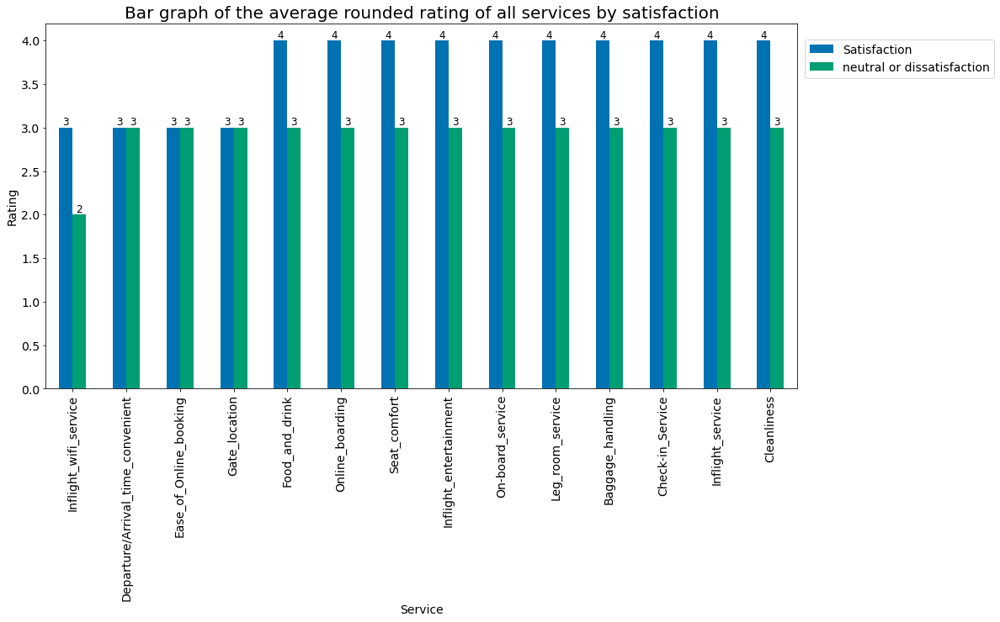

In [54]:
airline_data_TA2 = airline_data.groupby(['Satisfaction'])[['Inflight_wifi_service',
                                                           'Departure/Arrival_time_convenient',
                                                           'Ease_of_Online_booking',
                                                           'Gate_location',
                                                           'Food_and_drink',
                                                           'Online_boarding',
                                                           'Seat_comfort',
                                                           'Inflight_entertainment',
                                                           'On-board_service',
                                                           'Leg_room_service',
                                                           'Baggage_handling',
                                                           'Check-in_Service',
                                                           'Inflight_service',
                                                           'Cleanliness']].mean().round(0)
airline_data_TA2 = airline_data_TA2.T

plt.figure() # Define a space to plot
ax = airline_data_TA2.plot(kind='bar', 
                           figsize=(16, 8), 
                           legend=True, 
                           grid=False,
                            fontsize=14)

plt.title('Bar graph of the average rounded rating of all services by satisfaction', fontsize=20)
plt.xlabel('Service', fontsize=14)
plt.ylabel('Rating', fontsize=14)
plt.legend(loc=(1.01,0.85), ncol=1, fontsize=14) # To tweak the legend

for container in ax.containers:
    ax.bar_label(container)

plt.show()

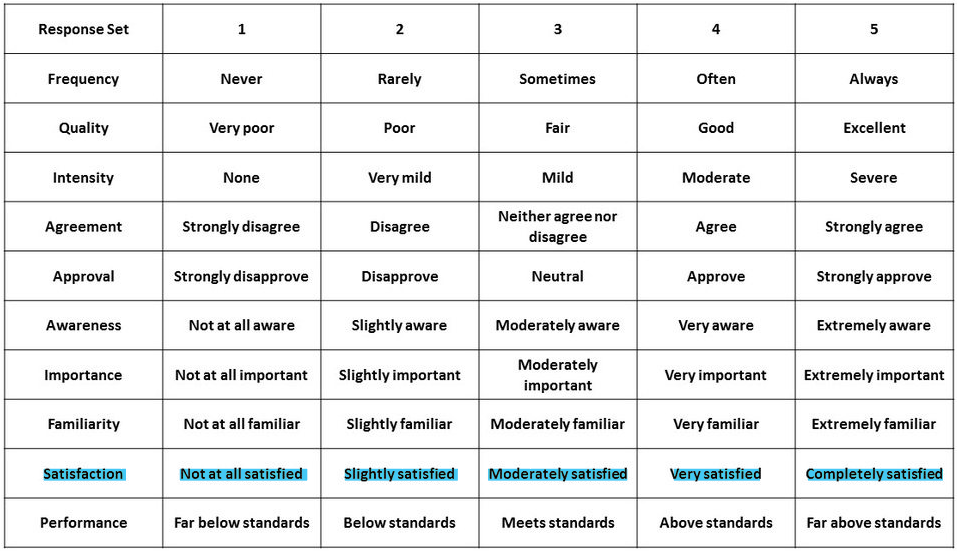

From the above we see that:
1. Customers that are satisfied (Satisfaction) typically are very satisfied (4) with the 'Food_and_drink', 'Online_boarding', 'Seat_comfort', 'Inflight_entertainment', 'On-board_service', 'Leg_room_service', 'Baggage_handling', 'Check-in_Service', 'Inflight_service' and 'Cleanliness' services
2. Customers that are neutral or dissatisfied (neutral or dissatisfaction) typically are only moderately satisfied (3) with a majority of the services

However, it is also noted that the 'Inflight_wifi_service' service sees unusually low scores with neutral or dissatisfied customers (neutral or dissatisfaction) who now differ from the observed norm of moderate satisfaction (3) to rate this service with a '2' (Slightly Satisfied)
- This tells us that out of all the services, customers were particularily dissatisfied with 'Inflight_wifi_service'

#### Hence the <FONT COLOR="DarkRed"> <b>'Inflight_wifi_service' service is this airline's weak point </b> </FONT> as its scores range from 2-3

#### While <FONT COLOR="DarkGreen"> <b>'Food_and_drink', 'Online_boarding', 'Seat_comfort', 'Inflight_entertainment', 'On-board_service', 'Leg_room_service', 'Baggage_handling', 'Check-in_Service', 'Inflight_service' and 'Cleanliness' services are this airline's strong points</b> </FONT> as its scores range from 3-4


***

## Take-away 3 : 

### <FONT COLOR="DarkRed"> Services 'Departure/Arrival_time_convenient', 'Ease_of_Online_booking', 'Inflight_wifi_service' and 'Online_boarding' are likely to be under-used or have made very little impact on the Customers </FONT>
### They make up the largest portion of all 0 (Not Applicable) scores  at <FONT COLOR="DarkGreen"> 33.3%, 28.2%, 19.5% and 15.2%</FONT> respectively 

In [55]:
airline_data_TA3 = airline_data[['Inflight_wifi_service', 
                                 'Departure/Arrival_time_convenient', 
                                 'Ease_of_Online_booking',
                                 'Online_boarding',
                                'Gate_location',
                                'Food_and_drink',
                                'Seat_comfort',
                                'Inflight_entertainment',
                                 'On-board_service',
                                 'Leg_room_service',
                                 'Baggage_handling',
                                 'Check-in_Service',
                                 'Inflight_service',
                                 'Cleanliness']]

airline_data_TA3 = \
airline_data_TA3.replace(1, np.nan).replace(2, np.nan).replace(3, np.nan).replace(4, np.nan).replace(5, np.nan)

airline_data_TA3 = airline_data_TA3.count()

names_TA3 = ['Inflight_wifi_service',
'Departure/Arrival_time_convenient',
'Ease_of_Online_booking',
'Online_boarding',
'Gate_location',
'Food_and_drink',
'Seat_comfort',
'Inflight_entertainment',
'On-board_service',
'Leg_room_service',
'Baggage_handling',
'Check-in_Service',
'Inflight_service',
'Cleanliness']

fig = px.pie(airline_data_TA3, 
             values=airline_data_TA3, 
             names=names_TA3,
             title="Pie Chart of the breakdown of ratings of all services by % of 0's (Not Applicable) scores")

fig.update_traces(textposition='inside', textinfo='percent')

fig.show()

From the above we note that:
1. Departure/Arrival_time_convenient (33.9%), Ease_of_Online_booking (27.9%), Inflight_wifi_service (19.8%) and Online_boarding (14.4%) are the 4 services that see the highest number of 0 (Not Applicable) scores
2. The remaining services occupy only 3.8% of all 0 (Not Applicable) scores, indicating that these services are heavily utilized by all surveyed customers to a point where they have an opinion on it

***

## Take-away 4 : 

### <FONT COLOR="DarkGreen"> 70% of Business Class (Business) Customers rate themselves as Satisfied (Satisfaction)</FONT>, this is expected as typically Business Class Customers are afforded better services and facilities for the premium they pay
### While <FONT COLOR="DarkRed"> only 19.3% of Economy (Eco) and 25.9% of Economy Plus (Eco Plus) Customers rate themselves as Satisfied (Satisfaction)</FONT>

#### As per our findings from insight 1, this indicates that a majority of the Economy (Eco) and Economy Plus (Eco Plus) Customers find the majority of the services and facilities made available to them to only be moderately satisfactory with the exception of the Inflight Wifi Service ('Inflight_wifi_service') which is typically only slightly satisfactory


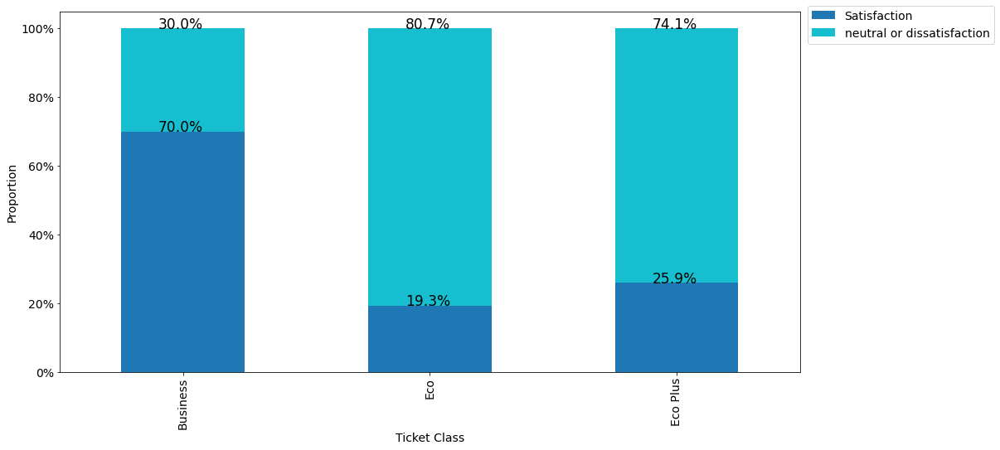

In [56]:
cross_tab_prop = pd.crosstab(index=airline_data['Class'],
                             columns=airline_data['Satisfaction'],
                             normalize="index")
# For % labels
cross_tab = pd.crosstab(index=airline_data['Class'],
                             columns=airline_data['Satisfaction'])


ax = cross_tab_prop.plot(kind='bar', 
                    stacked=True, 
                    colormap='tab10', 
                    figsize=(16, 8),
                    fontsize=14)

# Moves legend
plt.legend(loc=(1.01, 0.91), ncol=1, fontsize=14) # To tweak the legend

# formats 0.0 to 1.0 as 0% to 100%
ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))

plt.xlabel("Ticket Class", fontsize=14)
plt.ylabel("Proportion", fontsize=14)

for n, x in enumerate([*cross_tab.index.values]):
    for (proportion, y_loc) in zip(cross_tab_prop.loc[x],
                                   cross_tab_prop.loc[x].cumsum()):
        # numpy cumsum() function returns the cumulative sum of the elements along the given axis.
                
        plt.text(x=n - 0.10,
                 y=y_loc,
                 s=f'{np.round(proportion * 100, 1)}%', 
                 color="black",
                 fontsize=17)

plt.show()

***

## Take-away 5 : 

### <u> The majority of airline X's customers are Loyal</u>
### <FONT COLOR="DarkGreen"> Loyal Customers are typically male or female adults who largely travel for business purposes </FONT>
### While <FONT COLOR="DarkRed"> Disloyal Customers are slightly more likely to be female adults but also have a 33%  chance of being youths and they overwhelmingly travel for business reasons (100%-99%) </FONT>

In [57]:
sb_data = airline_data[['Gender', 'Customer_Type', 'Satisfaction', 'Type_of_Travel', 'Avg_services_rating', 'Age']]

fig = px.sunburst(sb_data, 
                  path=['Customer_Type', 'Gender', 'Age', 'Type_of_Travel'])
                  
fig.update_traces(textinfo="label+percent parent")

fig.layout.height = 850
fig.layout.width = 850
fig.layout.title = "Sunburst of Passenger Profile by Loyalty"

fig.show()

### Loyal Customers (82%)
- Gender, Age and Type of Travel closely mirror either gender
- Loyal customers are evenly split on Gender (50%)
- 80%~ of either gender are Adults
- Youths and Seniors make up 17% of Loyal male or female customers
- Loyal customers are typically adults that travel for business purposes (80%~ and 70% respectively for both genders)

### Disloyal Customers (18%)
- Females make up a larger portion of disloyal customers (54%)
- A 33% portion of disloyal customers are youths (32% v 11%)
- There are very few Seniors (1%)
- Gender, Age and Type of Travel closely mirror either gender
- 100%-99% of disloyal customers travel for business reasons

***

## <font color= grey> Correlation Analysis

## Correlation Set Up :
#### Change categorical to numerical for Gender, Age, Customer_Type, Type_of_Travel, Class, Satisfaction and Flight_Distance
#### - For use in correlation matrices

In [58]:
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OrdinalEncoder

In [59]:
# encode categorical columns using sklearn *LabelEncoder and *OrdinalEncoder
# Satisfaction was encoded specifically with label encoding as it is typically used for converting target variable 
le = LabelEncoder()
airline_data['Satisfaction'] = le.fit_transform(airline_data['Satisfaction'])

# The rest were encoded with ordinal encoding as it is typically used for converting features
enc = OrdinalEncoder()
airline_data[['Gender', 'Customer_Type', 'Type_of_Travel','Class', 'Flight_Distance', 'Age']] = enc.fit_transform(airline_data[['Gender', 'Customer_Type', 'Type_of_Travel','Class', 'Flight_Distance', 'Age']])

airline_data.head()

# *OrdinalEncoder is for the "features" (often a 2D array), 
# *whereas LabelEncoder is for the "target variable" (often a 1D array).

,Gender,Customer_Type,Age,Type_of_Travel,Class,Flight_Distance,Inflight_wifi_service,Departure/Arrival_time_convenient,Ease_of_Online_booking,Gate_location,Food_and_drink,Online_boarding,Seat_comfort,Inflight_entertainment,On-board_service,Leg_room_service,Baggage_handling,Check-in_Service,Inflight_service,Cleanliness,Departure_Delay_in_Minutes,Arrival_Delay_in_Minutes,Satisfaction,Flight_Distance_Num,Avg_services_rating,Age_Num
1,1.0,1.0,0.0,0.0,0.0,2.0,3,2,3,3,1,3,1,1,1,5,3,1,4,1,1,6,1,235,2.29,25
2,0.0,0.0,0.0,0.0,0.0,2.0,2,2,2,2,5,5,5,5,4,3,4,4,4,5,0,0,0,1142,3.71,26
3,0.0,0.0,0.0,0.0,0.0,2.0,2,5,5,5,2,2,2,2,2,5,3,1,4,2,11,9,1,562,3.00,25
4,1.0,0.0,0.0,0.0,0.0,2.0,3,3,3,3,4,5,5,3,3,4,4,3,3,3,0,0,0,214,3.50,61
5,0.0,0.0,0.0,1.0,1.0,2.0,3,4,2,1,1,2,1,1,3,4,4,4,4,1,0,0,1,1180,2.50,26


***

## Correlation : Pearson's (Standard Correlation Coefficient)
###  Measures the degree of the relationship between linearly related variables


In [60]:
corr_mat1 = pd.DataFrame({'Departure_Delay_in_Minutes ': airline_data['Departure_Delay_in_Minutes'],
                          'Arrival_Delay_in_Minutes ': airline_data['Arrival_Delay_in_Minutes'],
                          'Flight_Distance_Num ': airline_data['Flight_Distance_Num'],
                          'Age_Num ': airline_data['Age_Num'],
                          'Avg_services_rating ': airline_data['Avg_services_rating']})
corr = corr_mat1.corr()

colorscale=[[0.0, 'rgb(255,255,255)'], [.2, 'rgb(245,255,250)'],
            [.4, 'rgb(240,255,255)'], [.6, 'rgb(117, 117, 169)'],
            [.8, 'rgb(71, 71, 141)'],[1.0, 'rgb(25,25,112)']]

fig = go.Figure()
fig.add_trace(
    go.Heatmap(
        x = corr.columns,
        y = corr.index,
        z = np.array(corr),
        text=corr.values,
        texttemplate='%{text:.2f}',
        colorscale = colorscale
    )
)

fig.layout.height = 550
fig.layout.width = 600
fig.layout.title = "Heatmap of Pearson's correlation between Interval and Ratio columns"

fig.show()

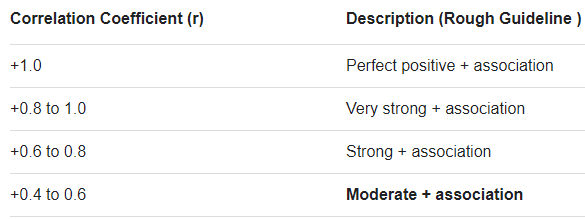
## Takeaways:
#### The values of:
1. Departure_Delay_in_Minutes and Arrival_Delay_in_Minutes (0.96)

#### Seem to be <u> very strongly correlated </u>  with each other as they have correlation coefficients above 0.8, indicating a very strong positive correlation between the two variables

***

## <font color= grey> Your Other Method 

## Correlation : Kendall's
#### Measures how likely it is for two variables to move in the same direction, but not necessarily at a constant rate
#### - IE If x increases by a certain amt, y increases by a certain amt

In [61]:
corr_mat2 = pd.DataFrame({'Inflight_wifi_service ': airline_data['Inflight_wifi_service'],
                          'Departure/Arrival_time_convenient ': airline_data['Departure/Arrival_time_convenient'],
                          'Ease_of_Online_booking ': airline_data['Ease_of_Online_booking'],
                          'Gate_location ': airline_data['Gate_location'],
                          'Food_and_drink ': airline_data['Food_and_drink'],
                          'Online_boarding ': airline_data['Online_boarding'],
                          'Seat_comfort ': airline_data['Seat_comfort'],
                          'Inflight_entertainment ': airline_data['Inflight_entertainment'],
                          'On-board_service ': airline_data['On-board_service'],
                          'Leg_room_service ': airline_data['Leg_room_service'],
                          'Baggage_handling ': airline_data['Baggage_handling'],
                          'Leg_room_service ': airline_data['Leg_room_service'],
                          'Check-in_Service ': airline_data['Check-in_Service'],
                          'Inflight_service ': airline_data['Inflight_service'],
                          'Cleanliness ': airline_data['Cleanliness'],
                          'Satisfaction ': airline_data['Satisfaction']})

corr = corr_mat2.corr(method = 'kendall')

colorscale=[[0.0, 'rgb(255,255,255)'], [.2, 'rgb(245,255,250)'],
            [.4, 'rgb(240,255,255)'], [.6, 'rgb(117, 117, 169)'],
            [.8, 'rgb(71, 71, 141)'],[1.0, 'rgb(25,25,112)']]

fig = go.Figure()
fig.add_trace(
    go.Heatmap(
        x = corr.columns,
        y = corr.index,
        z = np.array(corr),
        text=corr.values,
        texttemplate='%{text:.2f}', 
        colorscale=colorscale
    )
)

fig.layout.height = 1000
fig.layout.width = 1000
fig.layout.title = "Heatmap of Kendall's correlation between Ordinal columns"

fig.show()

## Takeaways:
#### The values of:
1. Ease_of_online_booking and Inflight_wifi_service (0.66)
2. Cleanliness and Seat_comfort (0.60)
3. Cleanliness and Inflight_entertainment (0.62)

#### Seem to be <u> strongly correlated </u> with each other as they have correlation coefficients above 0.6, indicating a strong positive correlation between the variable pairs


***

## Correlation : Spearman's
#### Similar to Kendall's correlation, however Nominal columns are being loaded here. This is as the columns have already been treated and converted to a numeric form

In [62]:
corr_mat3 = pd.DataFrame({'Gender ': airline_data['Gender'],
                          'Customer_Type ': airline_data['Customer_Type'],
                          'Type_of_Travel ': airline_data['Type_of_Travel'],
                          'Class ': airline_data['Class'],
                          'Satisfaction ': airline_data['Satisfaction']})

corr = corr_mat3.corr(method = 'spearman')

colorscale=[[0.0, 'rgb(255,255,255)'], [.2, 'rgb(245,255,250)'],
            [.4, 'rgb(240,255,255)'], [.6, 'rgb(117, 117, 169)'],
            [.8, 'rgb(71, 71, 141)'],[1.0, 'rgb(25,25,112)']]

fig = go.Figure()
fig.add_trace(
    go.Heatmap(
        x = corr.columns,
        y = corr.index,
        z = np.array(corr),
        text=corr.values,
        texttemplate='%{text:.2f}', 
        colorscale=colorscale
    )
)

fig.layout.height = 1000
fig.layout.width = 1000
fig.layout.title = "Heatmap of Spearman's correlation between Nominal columns"

fig.show()

## Takeaways:
#### The values of:
1. Type_of_Travel and Class (0.51)
2. Satisfaction and Type_of_Travel (0.44)

#### Seem to be <u> moderately correlated </u> with each other as they have correlation coefficients above 0.4, indicating a moderately positive correlation between the variable pairs


***

# <font color= maroon> Data Modelling

In [63]:
airline_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 98655 entries, 1 to 103884
Data columns (total 26 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Gender                             98655 non-null  float64
 1   Customer_Type                      98655 non-null  float64
 2   Age                                98655 non-null  float64
 3   Type_of_Travel                     98655 non-null  float64
 4   Class                              98655 non-null  float64
 5   Flight_Distance                    98655 non-null  float64
 6   Inflight_wifi_service              98655 non-null  int64  
 7   Departure/Arrival_time_convenient  98655 non-null  int64  
 8   Ease_of_Online_booking             98655 non-null  int64  
 9   Gate_location                      98655 non-null  int64  
 10  Food_and_drink                     98655 non-null  int64  
 11  Online_boarding                    98655 non-null  in

### To remove any possible bias, the dataset will be randomly shuffled

In [64]:
airline_data_model = airline_data.sample(frac=1, random_state=5077).reset_index(drop=True)
airline_data_model.reset_index(inplace=True, drop=True)
airline_data_model

,Gender,Customer_Type,Age,Type_of_Travel,Class,Flight_Distance,Inflight_wifi_service,Departure/Arrival_time_convenient,Ease_of_Online_booking,Gate_location,Food_and_drink,Online_boarding,Seat_comfort,Inflight_entertainment,On-board_service,Leg_room_service,Baggage_handling,Check-in_Service,Inflight_service,Cleanliness,Departure_Delay_in_Minutes,Arrival_Delay_in_Minutes,Satisfaction,Flight_Distance_Num,Avg_services_rating,Age_Num
0,1.0,0.0,0.0,1.0,1.0,2.0,2,5,2,4,4,2,4,4,3,5,4,4,4,4,0,0,1,362,3.64,49
1,1.0,0.0,0.0,1.0,2.0,2.0,2,2,3,3,2,3,2,2,3,4,2,1,3,2,67,78,1,481,2.43,64
2,1.0,0.0,0.0,0.0,0.0,0.0,2,2,1,2,4,5,3,2,2,2,2,2,2,2,0,0,0,2794,2.36,42
3,1.0,0.0,0.0,0.0,1.0,2.0,3,3,3,3,3,3,3,3,4,4,4,1,3,3,0,0,1,603,3.07,25
4,1.0,0.0,0.0,1.0,2.0,2.0,5,4,5,5,2,5,2,2,5,2,5,4,5,2,21,12,0,780,3.79,52
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98650,1.0,0.0,0.0,0.0,0.0,0.0,4,4,4,4,3,4,5,5,5,5,5,4,5,4,58,50,0,2322,4.36,58
98651,1.0,0.0,0.0,0.0,0.0,2.0,4,4,4,4,1,1,3,5,5,5,5,4,5,5,0,0,0,363,3.93,63
98652,0.0,1.0,2.0,0.0,0.0,2.0,4,1,4,5,3,4,1,3,4,3,5,4,5,3,1,0,0,283,3.50,21
98653,0.0,0.0,0.0,0.0,0.0,2.0,3,3,3,3,2,4,5,4,4,4,4,4,4,3,0,0,0,577,3.57,39


In [65]:
# imports needed for Linear Regression
import sklearn
from sklearn.utils import shuffle 
from sklearn import preprocessing 
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score, accuracy_score

---

# <font color= grey> Linear Regression </font>
#### * Linear regression only deals with continuous variables

## I'll be running two linear regressions to improve the values based on the p-value:

# 1

Target Attribute: 
- Avg_services_rating 
  
Features (any data type): 
- Age_Num
- Arrival_Delay_in_Minutes
- Flight_Distance_Num
- Gender
- Customer_Type
- Type_of_Travel
- Class

Excluded Columns:
- Ordinal columns (Target Leakage)
- Departure_Delay_in_Minutes (*Multicollinearity)
- Age (Derived Column)
- Flight_Distance (Derived Column)
- Satisfaction (Target Leakage)


*Multicollinearity is a statistical concept where several independent variables in a model are correlated. 
- Two variables are considered to be perfectly collinear if their correlation coefficient is +/- 1.0
- Multicollinearity among independent variables will result in less reliable statistical inferences
    - Departure_Delay_in_Minutes and Arrival_Delay_in_Minutes are very strongly correlated with each other as they have correlation coefficients above 0.8  (0.96), indicating a very strong positive correlation between the two variables

## Set Target Variable and Predictors

In [66]:
# Set the Target Attribute as Average Rating
y = airline_data_model['Avg_services_rating']

# Set the Predictors as the Features columns
x = airline_data_model[['Age_Num', 'Arrival_Delay_in_Minutes', 'Flight_Distance_Num', 'Gender', 'Customer_Type', 'Type_of_Travel', 'Class']]

#### As seen above in the Pearson's (Standard Correlation Coefficient), Avg_services_rating does not have any strong correlations with any of the predictors. 

#### As such I chose to include all the continuous and encoded variables and the numerical columns of Age and Flight_Distance in this analysis 

#### The purpose of doing so is to generate a comparison with my second analysis where I will include all the same columns but with the encoded Age and Flight_Distance instead

## Splitting the data between Training set and Validation set (70%:30%)

In [67]:
# Split the data between training and validation set, set the training size to 70% of the entire dataset
x_train, x_val, y_train, y_val = train_test_split(x, y, train_size = 0.7, shuffle=True, \
                                                 random_state=5077)

In [68]:
# Checking for appropriate split
print(x_train.shape)
print(x_val.shape)

(69058, 7)
(29597, 7)


#### The Training and Validation is set to split 70%:30% by random_state=5077, the split was checked and was deemed appropriate

## Training the model

In [69]:
#### Train/fit the linear regression model
# Create variable for linear regression
lin_reg = LinearRegression()
lin_reg.fit(x_train, y_train)

LinearRegression()

#### Training/fitting the linear regression model and assigning to a variable (lin_reg)

## Obtaining straight line equation of the model

In [70]:
print("Intercept: \n", lin_reg.intercept_)
print("Beta Coefficients: \n", lin_reg.coef_)

Intercept: 
 3.4532676676498673
Beta Coefficients: 
 [ 3.47663822e-04 -6.22605978e-04  1.13513746e-05  5.20069430e-03
 -1.94424297e-01 -5.92660904e-02 -2.34771439e-01]


#### <font color=blue> Equation </font>
Avg_services_rating = 
    (3.47663822e-04 x Age_Num) + 
    (-6.22605978e-04 x Arrival_Delay_in_Minutes) + 
    (1.13513746e-05 x Flight_Distance_Num) + 
    (5.20069430e-03 x Gender) + 
    (5.20069430e-03 x Customer_Type) + 
    (5.20069430e-03 x Type_of_Travel) + 
    (-2.34771439e-01 x Class) + 3.4532676676498673

#### <font color=blue> Takeaway: </font>
- Class seems to be the most influential predictor in predicting the value of Avg_services_rating as it has the coefficient with the largest impact of -2.34771439e-01

## Predict the y_val using extrapolation with the validation set

In [71]:
y_pred = lin_reg.predict(x_val)
y_pred

array([3.18959439, 3.00856181, 2.88489934, ..., 3.23105688, 3.41683742,
       3.26917555])

## Evaluate model performance

In [72]:
from sklearn.metrics import mean_squared_error, r2_score, accuracy_score

# RMSE is how far away the prediction is away from the actual, lower = better
print('Root Mean Squared Error: %0.2f' % mean_squared_error(y_val, y_pred, squared=False))

# Used to analyze how differences in one variable can be explained by a difference in a second variable, higher = better
print('Coefficient of Determination: %0.2f' % r2_score(y_val, y_pred))

Root Mean Squared Error: 0.63
Coefficient of Determination: 0.08


#### <font color=blue> Establish the baseline performance by comparing y_val('correct_ans') with y_pred (using the predicted x value)</font>
- Max Coeff of Determination is '1'
    
#### <font color=blue> Takeaways </font>
1. The best value for Coefficient of Determination is '1' whereas the model achieved '0.08' when predicting Avg_services_rating based on the continuous variables that are most likely to impact the Avg_services_rating instead

2. The model is inaccurate, only 8% of of the value of Avg_services_rating is predicted by the independent variables

3. Based on a rule of thumb, it can be said that RMSE values between 0.2 and 0.5 shows that the model can relatively predict the data accurately. However the Root Mean Squared Error is 0.63 which indicates that the prediction has some inaccuracy

#### <font color=blue> This indicates that the model is inaccurate and not reliable

In [73]:
import statsmodels.api as sm
# use another package to provide the full summary of the model
x_train = sm.add_constant(x_train)
x_val=sm.add_constant(x_val)
my_regr2 = sm.OLS(y_train, x_train).fit() #OLS means ordinary least square
print(my_regr2.summary())

y_pred2 = my_regr2.predict(x_val) #perform prediction
print(y_pred2)

                             OLS Regression Results                            
Dep. Variable:     Avg_services_rating   R-squared:                       0.080
Model:                             OLS   Adj. R-squared:                  0.080
Method:                  Least Squares   F-statistic:                     862.0
Date:                 Fri, 12 Aug 2022   Prob (F-statistic):               0.00
Time:                         17:01:43   Log-Likelihood:                -66026.
No. Observations:                69058   AIC:                         1.321e+05
Df Residuals:                    69050   BIC:                         1.321e+05
Df Model:                            7                                         
Covariance Type:             nonrobust                                         
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const         

D:\Applications\Anaconda\lib\site-packages\statsmodels\tsa\tsatools.py:142: FutureWarning:

In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only



#### <font color=blue>Takeaways </font>
- Predictors Arrival_Delay_in_Minutes, Flight_Distance_Num, Customer_Type, Type_of_Travel and Class have a P-value below 0.05 which means that they are all statistically significant and relevant to the model
- Other attributes in the data should be further analysed to find out if they could possibly correlated with Avg_services_rating. Attributes that are found to be correlated should be put in future linear regression models to further improve it
- The Scikit Learn model would be considered the baseline model

# 2

Target Attribute: 
- Avg_services_rating 
  
Features (any data type): 
- Arrival_Delay_in_Minutes
- Flight_Distance_Num
- Customer_Type
- Type_of_Travel
- Class

Excluded Columns:
- Ordinal columns (Target Leakage)
- Departure_Delay_in_Minutes (Multicollinearity)
- Age
- Flight_Distance
- Satisfaction (Target Leakage)
- Age_Num (High p-value)
- Gender (High p-value)

## Set Target Variable and Predictors

In [74]:
# Set the Target Attribute as Average Rating
y = airline_data_model['Avg_services_rating']

# Set the Predictors as the Features columns
x = airline_data_model[['Arrival_Delay_in_Minutes', 'Flight_Distance_Num', 'Customer_Type', 'Type_of_Travel', 'Class']]

## Splitting the data between Training set and Validation set (70%:30%)

In [75]:
# Split the data between training and validation set, set the training size to 70% of the entire dataset
x_train, x_val, y_train, y_val = train_test_split(x, y, train_size = 0.7, shuffle=True, \
                                                 random_state=5077)
# Checking for appropriate split
print(x_train.shape)
print(x_val.shape)

(69058, 5)
(29597, 5)


#### The Training and Validation is set to split 70%:30% by random_state=5077, the split was checked and was deemed appropriate

## Training the model

In [76]:
#### Train/fit the linear regression model
# Create variable for linear regression
lin_reg = LinearRegression()
lin_reg.fit(x_train, y_train)

LinearRegression()

## Obtaining straight line equation of the model

In [77]:
print("Intercept: \n", lin_reg.intercept_)
print("Beta Coefficients: \n", lin_reg.coef_)

'Arrival_Delay_in_Minutes', 'Flight_Distance_Num', 'Customer_Type', 'Type_of_Travel', 'Class'

Intercept: 
 3.4713960917399147
Beta Coefficients: 
 [-6.23835968e-04  1.12144898e-05 -1.98985089e-01 -5.95127588e-02
 -2.35193378e-01]


('Arrival_Delay_in_Minutes',
 'Flight_Distance_Num',
 'Customer_Type',
 'Type_of_Travel',
 'Class')

#### <font color=blue> Equation </font>
Avg_services_rating = 
    (-6.23835968e-04 x Arrival_Delay_in_Minutes) + 
    (1.12144898e-05 x Flight_Distance_Num) + 
    (-1.98985089e-01 x Customer_Type) + 
    (-5.95127588e-02 x Type_of_Travel) + 
    (-2.35193378e-01 x Class) + 3.4713960917399147

#### <font color=blue> Takeaway: </font>
- Class seems to be the most influential predictor in predicting the value of Avg_services_rating as it has the coefficient with the largest impact of -2.35193378e-01

## Predict the y_val using extrapolation with the validation set

In [78]:
y_pred = lin_reg.predict(x_val)
y_pred

array([3.17922443, 3.00460919, 2.89108277, ..., 3.23515535, 3.41968862,
       3.26320605])

## Evaluate model performance

In [79]:
from sklearn.metrics import mean_squared_error, r2_score, accuracy_score

# RMSE is how far away the prediction is away from the actual, lower = better
print('Root Mean Squared Error: %0.2f' % mean_squared_error(y_val, y_pred, squared=False))

# Used to analyze how differences in one variable can be explained by a difference in a second variable, higher = better
print('Coefficient of Determination: %0.2f' % r2_score(y_val, y_pred))

Root Mean Squared Error: 0.63
Coefficient of Determination: 0.08


#### <font color=blue> Establish the baseline performance by comparing y_val('correct_ans') with y_pred (using the predicted x value)</font>
- Max Coeff of Determination is '1'
    
#### <font color=blue> Takeaways </font>
1. The best value for Coefficient of Determination is '1' whereas the model achieved '0.08' when predicting Avg_services_rating based on the continuous variables that are most likely to impact the Avg_services_rating instead

2. The model is inaccurate, only 8% of of the value of Avg_services_rating is predicted by the independent variables

3. Based on a rule of thumb, it can be said that RMSE values between 0.2 and 0.5 shows that the model can relatively predict the data accurately. However the Root Mean Squared Error is 0.63 which indicates that the prediction has some inaccuracy

#### <font color=blue> This indicates that the model is inaccurate and not reliable
    - No change from model 1

In [80]:
import statsmodels.api as sm
# use another package to provide the full summary of the model
x_train = sm.add_constant(x_train)
x_val=sm.add_constant(x_val)
my_regr2 = sm.OLS(y_train, x_train).fit() #OLS means ordinary least square
print(my_regr2.summary())

y_pred2 = my_regr2.predict(x_val) #perform prediction
print(y_pred2)

                             OLS Regression Results                            
Dep. Variable:     Avg_services_rating   R-squared:                       0.080
Model:                             OLS   Adj. R-squared:                  0.080
Method:                  Least Squares   F-statistic:                     1206.
Date:                 Fri, 12 Aug 2022   Prob (F-statistic):               0.00
Time:                         17:01:43   Log-Likelihood:                -66028.
No. Observations:                69058   AIC:                         1.321e+05
Df Residuals:                    69052   BIC:                         1.321e+05
Df Model:                            5                                         
Covariance Type:             nonrobust                                         
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const         

D:\Applications\Anaconda\lib\site-packages\statsmodels\tsa\tsatools.py:142: FutureWarning:

In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only



#### <font color=blue>Takeaways </font>
- All predictors now have a P-value below 0.05 which means that they are all statistically significant and relevant to the model
- However there has been no significant change in the RMSE and R-squared values indicating that even after the removal of the high p-valued predictors, the model is still inaccurate

## Graph of Actual vs Fitted Values

D:\Applications\Anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

D:\Applications\Anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).



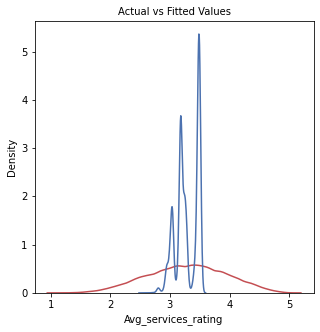

In [81]:
import seaborn as sns
plt.figure(figsize=(5, 5))

ax = sns.distplot(y, hist=False, color="r", label="Actual Value")
sns.distplot(y_pred, hist=False, color="b", label="Fitted Values" , ax=ax)

plt.title('Actual vs Fitted Values')

plt.show()
plt.close()

#### <font color=blue> Takeaways </font>

1. The graph follows a normal pattern, which is why the graph assumes normality
2. Both Actual and Fitted values peak at the same place (3~)
3. The Actual and Fitted values differ greatly

---

# <font color= grey> Logistic Regression

## I'll be running two Logistic Regressions to confirm the accuracy:

# 1

Target Attribute: 
- Satisfaction
  
Features (any data type): 
- 'Customer_Type'
- 'Type_of_Travel'
- 'Class'
- 'Arrival_Delay_in_Minutes'
- 'Flight_Distance_Num'
- 'Age_Num' 
    
Excluded Columns:
- Satisfaction
- Departure_Delay_in_Minutes (Multicollinearity)
- Age (Numerical form already present)
- Flight_Distance (Numerical form already present)
- Gender (Extremely Low correlation)
- Ordinal columns (As derived column Avg_services_rating is already present)


## Set Target Variable and Predictors

In [82]:
# Set the Target Attribute as Average Rating
y = airline_data_model['Satisfaction']

# Set the Predictors as the Features columns
x = airline_data_model[['Customer_Type', 'Type_of_Travel', 'Class', 'Arrival_Delay_in_Minutes', 'Flight_Distance_Num', 'Age_Num']]

x.head()

,Customer_Type,Type_of_Travel,Class,Arrival_Delay_in_Minutes,Flight_Distance_Num,Age_Num
0,0.0,1.0,1.0,0,362,49
1,0.0,1.0,2.0,78,481,64
2,0.0,0.0,0.0,0,2794,42
3,0.0,0.0,1.0,0,603,25
4,0.0,1.0,2.0,12,780,52


As seen above in the Spearman's Correlation, Satisfaction is strongly to moderately positively correlated to Class, Type_of_Travel and Customer_Type

Arrival_Delay_in_Minutes and Flight_Distance_Num were selected due to domain knowledge as these factors have the potential to affect satisfaction (IE High Arrival_Delay_in_Minutes or Longer Flight_Distance_Num may make customers less satisfied)
    
Age_Num was selected as satisfaction can differ by age (IE Older customers may be more difficult to satisfy)

## Splitting the data between Training set and Validation set (70%:30%)

In [83]:
# Split the data between training and validation set, set the training size to 70% of the entire dataset
X_train, X_val, Y_train, Y_val = train_test_split(x, y, train_size = 0.7, shuffle=True, \
                                                 random_state=5077)

In [84]:
X_train.shape

(69058, 6)

## Train the Model

In [85]:
from sklearn import linear_model
#define a placeholder
my_classifier = linear_model.LogisticRegression(max_iter=10000) #if don't forget loop to optimise
#if cannot find the global min, keep looping

#fit the x and y data into the model
#this will give the best parameters to minimize the error term (find the 'best-fit-line')
my_classifier.fit(X_train, Y_train)

LogisticRegression(max_iter=10000)

## Obtaining the model equation

In [86]:
print("Intercept: \n", my_classifier.intercept_)
print("Beta Coefficients: \n", my_classifier.coef_[0])
'Customer_Type', 'Type_of_Travel', 'Class', 'Arrival_Delay_in_Minutes', 'Flight_Distance_Num', 'Age_Num'

Intercept: 
 [-1.38212624]
Beta Coefficients: 
 [ 1.87203190e+00  2.46980055e+00  9.38957917e-01  4.58635408e-03
 -2.27909351e-05  2.91916104e-03]


('Customer_Type',
 'Type_of_Travel',
 'Class',
 'Arrival_Delay_in_Minutes',
 'Flight_Distance_Num',
 'Age_Num')

#### <font color=blue> Equation </font>
Probabilities of Satisfaction = 1/1 + exp - ((1.87203190e+00 * Customer_Type) + (2.46980055e+00 * Type_of_Travel) + (9.38957917e-01 * Class) + (4.58635408e-03 * Arrival_Delay_in_Minutes) + (-2.27909351e-05 * Flight_Distance_Num) + (2.91916104e-03 * Age_Num) + 1.38212624)

#### <font color=blue> Takeaways </font>
- Class is the most influential predictor in the logistic model as it has the highest coefficient of 9.38957917e-01
- Customer_Type, Arrival_Delay_in_Minutes, Class, Arrival_Delay_in_Minutes and Age_Num have positive coefficients which means that they increase the probability of customer satisfaction
- Flight_Distance_Num have negative coefficients which means that they decrease the probability of customer satisfaction
- However, all of the coefficients are very small, meaning that most of them have minimal impact on the model

## Evaluate the model

In [87]:
Y_pred = my_classifier.predict(X_val)

print("Accuracy: %0.2f " %accuracy_score(Y_val, Y_pred))

Accuracy: 0.77 


#### <font color=blue> Takeaways </font>
- The logistic model had an accuracy of around 77%
- The accuracy of the model is low, meaning that it is not very accurate in predicting the probability of customer satisfaction

In [88]:
X_train = sm.add_constant(X_train)
log_reg = sm.Logit(Y_train, X_train).fit()

Optimization terminated successfully.
         Current function value: 0.487873
         Iterations 6


D:\Applications\Anaconda\lib\site-packages\statsmodels\tsa\tsatools.py:142: FutureWarning:

In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only



In [89]:
# print statsmodel for logistic regression
print(log_reg.summary()) 

                           Logit Regression Results                           
Dep. Variable:           Satisfaction   No. Observations:                69058
Model:                          Logit   Df Residuals:                    69051
Method:                           MLE   Df Model:                            6
Date:                Fri, 12 Aug 2022   Pseudo R-squ.:                  0.2909
Time:                        17:01:46   Log-Likelihood:                -33692.
converged:                       True   LL-Null:                       -47512.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                       -1.3841      0.042    -33.027      0.000      -1.466      -1.302
Customer_Type                1.8740      0.028     68.048      0.000       1.820       1.

#### <font color=blue> Takeaways </font>
- All predictors are statistically significant as they have a P-Value that is below 0.05
- The Scikit Learn model would be considered the baseline model

# 2 : Random Forest

#### Random Forest will be used to confirm the accuracy through use of a differing method
- Used as it reduces bias and increases stability

Target Attribute: 
- Satisfaction
  
Features (any data type): 
- 'Gender'
- 'Customer_Type'
- 'Type_of_Travel'
- 'Class'
- 'Arrival_Delay_in_Minutes'
- 'Flight_Distance_Num'
- 'Age_Num' 
    
Excluded Columns:
- Satisfaction
- Departure_Delay_in_Minutes (Multicollinearity)
- Age (Numerical form already present)
- Flight_Distance (Numerical form already present)
- Gender (Extremely Low correlation)
- Ordinal columns (As derived column Avg_services_rating is already present)

In [90]:
from sklearn.ensemble import RandomForestRegressor
from sklearn import metrics

x3 = x
y3 = y
X_train, X_test, y_train, y_test = train_test_split(x3, y3, test_size=0.7, random_state=4796)
x3

,Customer_Type,Type_of_Travel,Class,Arrival_Delay_in_Minutes,Flight_Distance_Num,Age_Num
0,0.0,1.0,1.0,0,362,49
1,0.0,1.0,2.0,78,481,64
2,0.0,0.0,0.0,0,2794,42
3,0.0,0.0,1.0,0,603,25
4,0.0,1.0,2.0,12,780,52
...,...,...,...,...,...,...
98650,0.0,0.0,0.0,50,2322,58
98651,0.0,0.0,0.0,0,363,63
98652,1.0,0.0,0.0,0,283,21
98653,0.0,0.0,0.0,0,577,39


In [91]:
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

StandardScaler standardizes the data

In [92]:
regressor = RandomForestRegressor(n_estimators=100, random_state=5077)
regressor.fit(X_train, y_train)
y_pred = regressor.predict(X_test)
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
print("Intercept: \n", my_classifier.intercept_)
print("Beta Coefficients: \n", my_classifier.coef_[0])
print("Accuracy: %0.2f" % accuracy_score(Y_val, Y_pred))

Mean Absolute Error: 0.28984742516421597
Mean Squared Error: 0.17109281670265447
Root Mean Squared Error: 0.4136336745269351
Intercept: 
 [-1.38212624]
Beta Coefficients: 
 [ 1.87203190e+00  2.46980055e+00  9.38957917e-01  4.58635408e-03
 -2.27909351e-05  2.91916104e-03]
Accuracy: 0.77


#### <font color=blue> Takeaways </font>
- The logistic model had an accuracy of around 78%
- This allows me to confirm that the accuracy is appropriate as the two models have similar accuracies (0.77 v 0.78)

---

# <font color= grey> k-means clustering </font>
#### k-means clustering algorithm works for continuous numerical attributes only
- Multicollinarity does not matter here

## Creating a separate copy of the encoded data 

In [93]:
airline_kmeans = airline_data_model
airline_kmeans.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 98655 entries, 0 to 98654
Data columns (total 26 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Gender                             98655 non-null  float64
 1   Customer_Type                      98655 non-null  float64
 2   Age                                98655 non-null  float64
 3   Type_of_Travel                     98655 non-null  float64
 4   Class                              98655 non-null  float64
 5   Flight_Distance                    98655 non-null  float64
 6   Inflight_wifi_service              98655 non-null  int64  
 7   Departure/Arrival_time_convenient  98655 non-null  int64  
 8   Ease_of_Online_booking             98655 non-null  int64  
 9   Gate_location                      98655 non-null  int64  
 10  Food_and_drink                     98655 non-null  int64  
 11  Online_boarding                    98655 non-null  int

In [94]:
airline_kmeans = airline_kmeans[['Age_Num', 'Flight_Distance_Num', 'Arrival_Delay_in_Minutes', 'Departure_Delay_in_Minutes', 'Avg_services_rating']]
airline_kmeans.info()
# Dropping derived, rating and catergorical columns

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 98655 entries, 0 to 98654
Data columns (total 5 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Age_Num                     98655 non-null  int64  
 1   Flight_Distance_Num         98655 non-null  int64  
 2   Arrival_Delay_in_Minutes    98655 non-null  int64  
 3   Departure_Delay_in_Minutes  98655 non-null  int64  
 4   Avg_services_rating         98655 non-null  float64
dtypes: float64(1), int64(4)
memory usage: 3.8 MB


## Find the scaling/normalisation factors to transform the data

In [95]:
# create a variable for sklearn's standard scaler 
scaler = StandardScaler()

scaled_airline_data = scaler.fit_transform(airline_kmeans)

## Scale/Normalize the dataframe according to the found factors

In [96]:
pd.DataFrame(scaled_airline_data)

,0,1,2,3,4
0,0.581077,-0.835114,-0.390993,-0.386912,0.540936
1,1.658015,-0.717076,1.627362,1.366214,-1.305580
2,0.078506,1.577229,-0.390993,-0.386912,-1.412404
3,-1.142024,-0.596062,-0.390993,-0.386912,-0.328910
4,0.796464,-0.420492,-0.080477,0.162575,0.769843
...,...,...,...,...,...
98650,1.227240,1.109044,0.902824,1.130719,1.639690
98651,1.586219,-0.834122,-0.390993,-0.386912,0.983490
98652,-1.429208,-0.913475,-0.390993,-0.360746,0.327290
98653,-0.136882,-0.621852,-0.390993,-0.386912,0.434113


## Building the Kmeans model
- Set 'k'
- Use random *seed* as initial centroids
- Set the number of times the algo with run with different sets of *seeds* and return the results with the lowest Sum of Square Errors
- Set random state to obtain reproducible results
- Set the maximum allowable iterations (even if data doesn't converge, terminate)

In [97]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from kneed import KneeLocator
from scipy.spatial.distance import cdist

In [98]:
kmeans = KMeans(n_clusters=3, init='random', n_init=10, \
               random_state=5077, max_iter=100)

kmeans.fit(scaled_airline_data)

KMeans(init='random', max_iter=100, n_clusters=3, random_state=5077)

In [99]:
print("The number of iterations required to coverage: ", kmeans.n_iter_, '\n')
print("The lowest SSE from the runs: ",kmeans.inertia_, '\n')
print("The 3 cluster centroids are at: ", kmeans.cluster_centers_, '\n')
print("List of Labels: ", kmeans.labels_)

The number of iterations required to coverage:  35 

The lowest SSE from the runs:  297628.37981454533 

The 3 cluster centroids are at:  [[ 0.27045106  1.34698298 -0.17963641 -0.17488037  0.43530017]
 [-0.10467889 -0.53381225 -0.17110882 -0.17278582 -0.16436887]
 [-0.04902664 -0.0670907   3.45302324  3.4498323  -0.13740623]] 

List of Labels:  [1 1 0 ... 1 1 0]


#### <font color=blue> Takeaway </font>
- The inertia value is 297628.37981454533 when k = 3

In [100]:
airline_kmeans = airline_kmeans.assign (Cluster = lambda x:kmeans.labels_)
#view
airline_kmeans.head()

,Age_Num,Flight_Distance_Num,Arrival_Delay_in_Minutes,Departure_Delay_in_Minutes,Avg_services_rating,Cluster
0,49,362,0,0,3.64,1
1,64,481,78,67,2.43,1
2,42,2794,0,0,2.36,0
3,25,603,0,0,3.07,1
4,52,780,12,21,3.79,1


In [101]:
distortions = []
inertias = []
mapping1 = {}
mapping2 = {}
kRange = range(1,10)

for k in kRange:
    kmeans = KMeans(n_clusters=k).fit(scaled_airline_data)
    kmeans.fit(scaled_airline_data)
    
    distortions.append(sum(np.min(cdist(scaled_airline_data,kmeans.cluster_centers_,'euclidean'),axis=1)) / scaled_airline_data.shape[0])
    
    inertias.append(kmeans.inertia_)
    
    mapping1[k] = sum(np.min(cdist(scaled_airline_data,kmeans.cluster_centers_,'euclidean'),axis=1)) / scaled_airline_data.shape[0]
    
    mapping2[k]=kmeans.inertia_

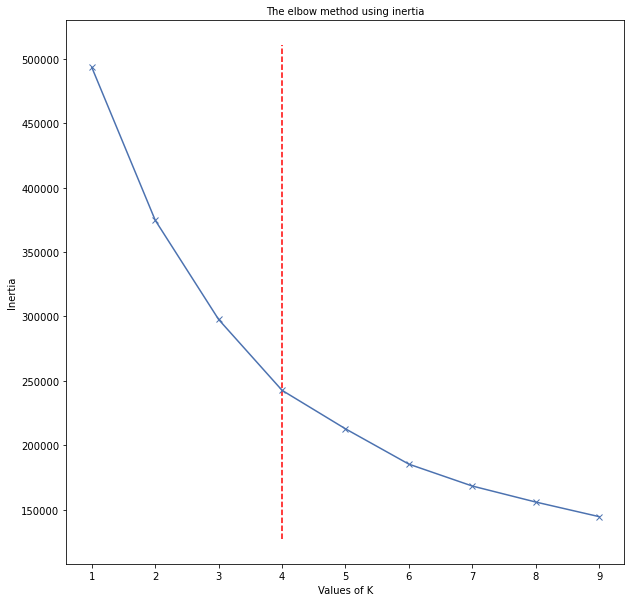

In [102]:
kn = KneeLocator(kRange,inertias,curve='convex',direction='decreasing')

plt.rcParams["figure.figsize"] = (10,10)
plt.plot(kRange,inertias,'bx-')
plt.xlabel('Values of K')
plt.ylabel('Inertia')
plt.vlines(kn.knee,plt.ylim()[0],plt.ylim()[1],linestyle='dashed',color='red')
plt.title('The elbow method using inertia')
plt.show()

# Inertia measures how well a dataset was clustered by K-Means. 
# It is calculated by measuring the distance between each data point and its centroid, 
# squaring this distance, and summing these squares across one cluster. 
# A good model is one with low inertia AND a low number of clusters ( K ).

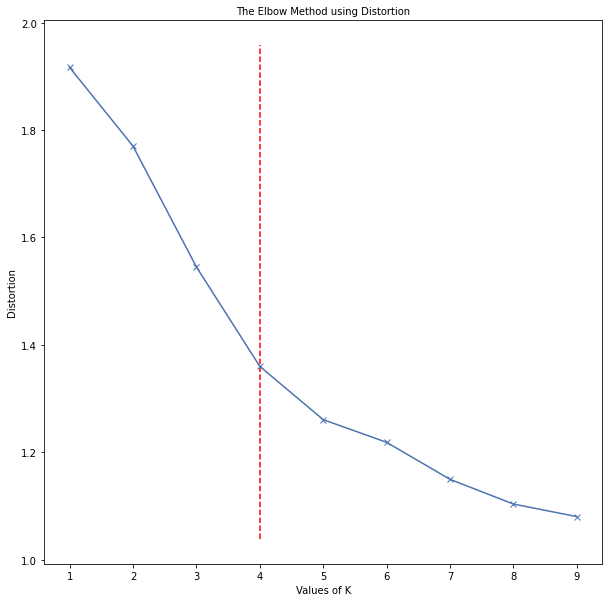

In [103]:
kn = KneeLocator(kRange,distortions,curve='convex',direction='decreasing')

plt.rcParams["figure.figsize"] = (10,10)
plt.plot(kRange,distortions,'bx-')
plt.xlabel('Values of K')
plt.ylabel("Distortion")
plt.vlines(kn.knee,plt.ylim()[0],plt.ylim()[1],linestyle='dashed',color='red')
plt.title("The Elbow Method using Distortion")
plt.show()

# It is calculated as the average of the squared distances from the cluster centers of the respective clusters.

Takeaway:
- There are 4 clusters present

### K has been amended to 4 as according to the elbow diagram

In [104]:
# k amended to 4
kmeans = KMeans(n_clusters=4, init='random', n_init=10, \
               random_state=5077, max_iter=100)

kmeans.fit(scaled_airline_data)

KMeans(init='random', max_iter=100, n_clusters=4, random_state=5077)

In [105]:
print("The number of iterations required to coverage: ", kmeans.n_iter_, '\n')
print("The lowest SSE from the runs: ",kmeans.inertia_, '\n')
print("The 3 cluster centroids are at: ", kmeans.cluster_centers_, '\n')
print("List of Labels: ", kmeans.labels_)

The number of iterations required to coverage:  19 

The lowest SSE from the runs:  242648.5585288442 

The 3 cluster centroids are at:  [[ 0.21146604  1.49317213 -0.17293161 -0.16980123  0.48196272]
 [-0.04742237 -0.04791434  3.60146349  3.60006336 -0.1339167 ]
 [ 0.89105161 -0.5011127  -0.16933981 -0.16848044  0.03549054]
 [-0.88489255 -0.44456868 -0.15846752 -0.16089396 -0.29960195]] 

List of Labels:  [2 2 0 ... 3 3 0]


#### <font color=blue> Takeaway </font>
- The inertia value is now 242648.5585288442 when k = 4

In [106]:
airline_kmeans = airline_kmeans.assign (Cluster = lambda x:kmeans.labels_)
#view
airline_kmeans.head()

,Age_Num,Flight_Distance_Num,Arrival_Delay_in_Minutes,Departure_Delay_in_Minutes,Avg_services_rating,Cluster
0,49,362,0,0,3.64,2
1,64,481,78,67,2.43,2
2,42,2794,0,0,2.36,0
3,25,603,0,0,3.07,3
4,52,780,12,21,3.79,2


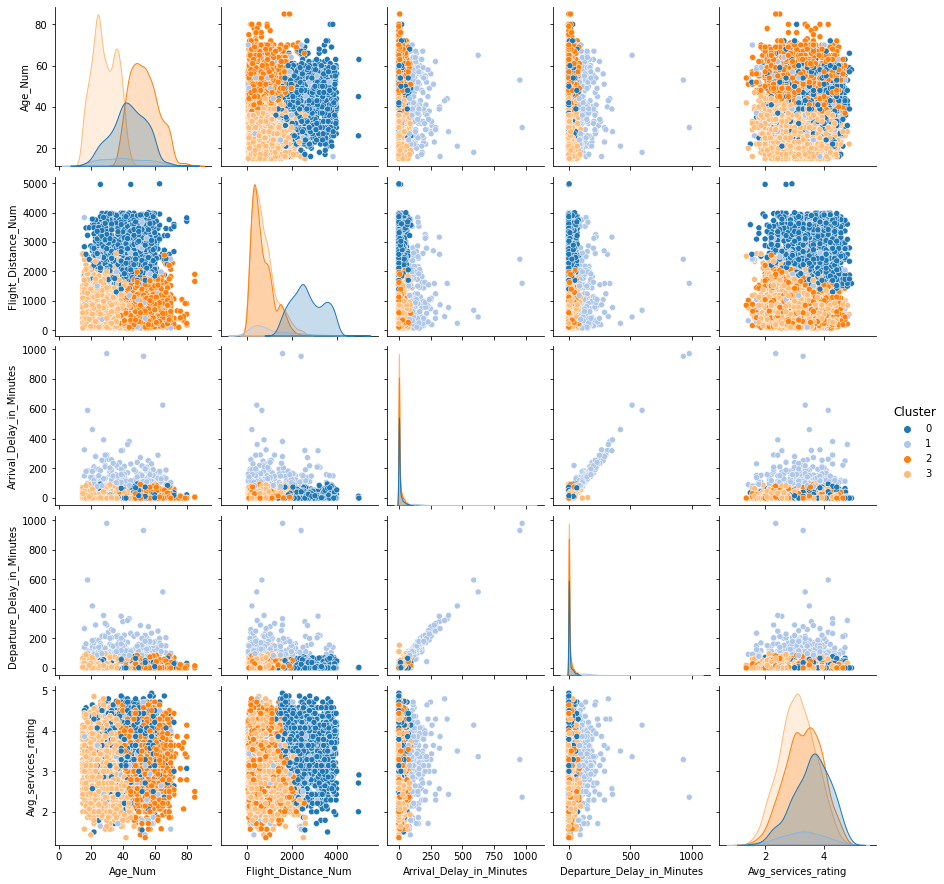

In [107]:
sns.pairplot(airline_kmeans.sample(n=5000), hue='Cluster', palette='tab20')

#### Takeways:
1. Older long distance flyers tend to be from cluster 0
2. Departure and Arrival delay does not seem to affect Avg_services_rating
3. Cluster 0 tend to have higher Avg_services_rating with longer flights
4. Clusters 2 and 3 tend to be older and younger respectively, they typically also do not fly as far as Cluster 0 customers
5. Cluster 1 customers tend to see longer arrival and departure delay

---

# <font color= maroon> Recommendations & Conclusion

### Conclusion:
Linear Regression should not be used
1. There are few numeric columns that can help with the problem statement
2. The model was run the first time to spot Predictors with high p-values, however even after removing them, there has been no significant change in the RMSE and R-squared values indicating that the model has not improved and is still inaccurate

Logistic Regression sees better accuracy and does not show signs of overfitting
1. The accuracy was tested by the use of a second model and when comparing the 2 accuracies (77 v 78) they are very similar and are hence appropriate
2. The dataset has many categorical datas that greatly help with the problem statement

Kmeans clustering provides great insights into solving the problem statements
1. Not every cluster is distinct but 0 and 3 are more observed

### Recommendations:
1. Reduce data ambiguity, columns such as Satisfaction have no references in the data dictionary. By reducing ambiguity we can predict with a higher confidence and accuracy with much better coefficients of dependants.

2. From the linear regression, Class seems to be the most influential predictor in predicting the value of Avg_services_rating as it has the coefficient with the largest impact of -2.34771439e-01. Furthermore for my EDA Take-away 4, I determined that Business class has the highest satisfaction, hence as a negative correlation indicates a lower Avg_services_rating, it is likely that the lower Avg_services_rating's come from the Eco and Eco plus classes. Airline X must work to improve the Eco and Eco Plus experience in order to increase Avg_services_rating.

3. From the logistic regression, Class is the most influential predictor in the logistic model as it has the highest coefficient of 9.38957917e-01. As such, we can see that Class has a high positive coefficient and so is important increasing the satisfaction. Flight_Distance_Num however has a negative coefficients which means that it decreases the probability of customer satisfaction. Hence Airline X must work towards bettering the experience of long distance flyers in order to improve customer satisfaction

4. From the kmeans; Older long distance flyers tend to be from cluster 0, Departure and Arrival delay does not seem to affect Avg_services_rating, Cluster 0 tend to have higher Avg_services_rating with longer flights, Clusters 2 and 3 tend to be older and younger respectively, they typically also do not fly as far as Cluster 0 customers, Cluster 1 customers tend to see longer arrival and departure delay. Hence airline x should observe the characteristics of cluster 0 customers as they bring the most value to the airline and seem to be the easiest to please


# <font color= maroon> References

- https://plotly.com/python/
- https://www.geeksforgeeks.org/graph-plotting-in-python-set-1/
- https://www.statisticssolutions.com/free-resources/directory-of-statistical-analyses/correlation-pearson-kendall-spearman/
- https://www.tessellationtech.io/data-science-stats-review/#:~:text=Spearman%27s%20is%20incredibly%20similar%20to,preferred%20method%20of%20the%20two.
- https://www.geeksforgeeks.org/graph-plotting-in-python-set-1/